In [1]:
import os
import sys
from datetime import datetime
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import importlib
import math
import json
import matplotlib.patches as patches

##
matplotlib.rcParams['pdf.fonttype'] = 42

## Helpful locations which are assumed to already exist
work_dir = f"/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Yuanyuan/Project/BGa/results/fig7" 
data_dir = f"/allen/programs/celltypes/workgroups/rnaseqanalysis/hct_ux3_cellxgene/anndata_080/BasalGanglia/Astro/linking"
os.chdir(work_dir)


/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/yuanyuan.fu/bin/miniconda3/envs/iterative_scANVI_May9/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/

### Siletti 

In [2]:
siletti = sc.read_h5ad(data_dir + "/Siletti_astro_norm.h5ad")

In [3]:
type1_clusters = [52, 53, 54, 55, 56, 57, 58, 61]

siletti.obs['Type'] = siletti.obs['cluster_id'].apply(lambda x: 'Type1' if x in type1_clusters else 'Type2')
siletti.obs['Type'] = siletti.obs['Type'].astype('category')

In [4]:
siletti.obs["cluster_id"] = siletti.obs["cluster_id"].astype(str)
desired_siletti_order = ["52", "53", "54", "55", "58", "57", "56", "60", "59", "62", "61", "64", "63"]

#siletti_meta = {
 #   "52": "Type1 TE (GM Cx)", 
 #   "53": "Type1 TE (GM HIP)",
 #   "54": "Type1 TE (GM Cx-HIP-AMY)",
 #   "55": "Type1 TE (GM Pu-CaB-SI)",
 #   "56": "Type1 TE (mix HTH-THM-AMY)",
 #   "57": "Type1 TE (mix HIP-BF)",
 #   "58": "Type1 TE (ILA Cx-HIP)",
 #   "61": "Type1 TE (WM HIP-Cx-BF)",
 #   "64": "Type2 NT (WM HTH)",
 #   "63": "Type2 NT (WM MY-SpC-Pn)",
 #   "62": "Type2 NT (mix GP-CB-M)",
 #   "60": "Type2 NT (GM THM-M-Pn)",
 #   "59": "Type2 NT (GM Pn-CB-MY)",
#}

siletti_meta = {
    "52": "TE (GM Cx)", 
    "53": "TE (GM HIP)",
    "54": "TE (GM Cx-HIP-AMY)",
    "55": "TE (GM Pu-CaB-SI)",
    "56": "TE (mixed HTH-THM-AMY)",
    "57": "TE (mixed HIP-BF)",
    "58": "TE (ILA Cx-HIP)",
    "61": "TE (WM HIP-Cx-BF)",
    "64": "NT (WM HTH)",
    "63": "NT (WM MY-SpC-Pn)",
    "62": "NT (mixed GP-CB-M)",
    "60": "NT (GM THM-M-Pn)",
    "59": "NT (GM Pn-CB-MY)",
}

siletti.obs["cluster_id_notes"] = siletti.obs["cluster_id"].map(lambda x: f"{x}: {siletti_meta[x]}")

categories_with_numbers = [f"{k}: {siletti_meta[k]}" for k in desired_siletti_order]
siletti.obs["cluster_id_notes"] = pd.Categorical(
    siletti.obs["cluster_id_notes"],
    categories=categories_with_numbers,
    ordered=True
)


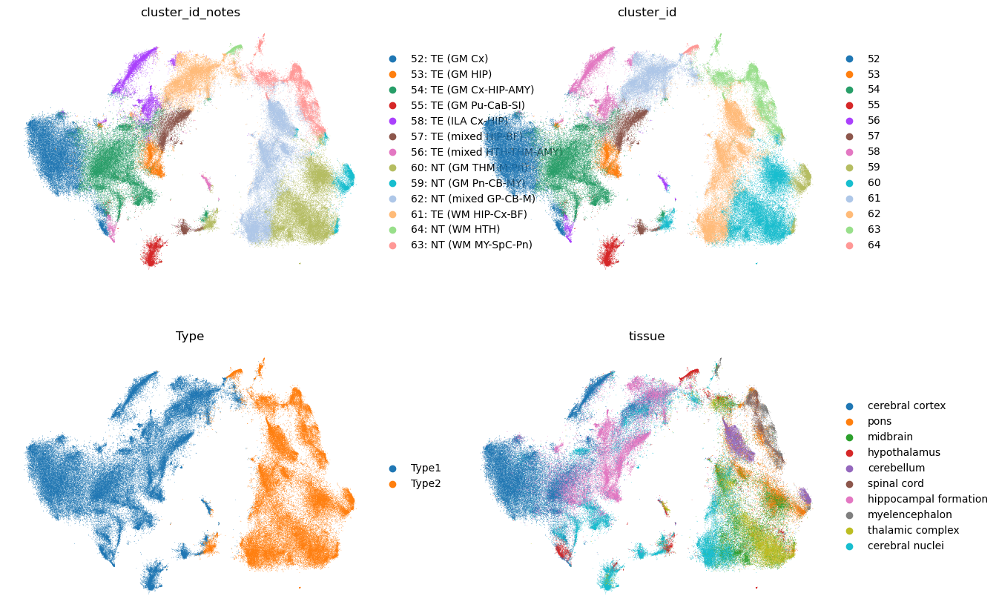

In [7]:
sc.pl.embedding(
    siletti,
    basis="X_tSNE",
    color=['cluster_id_notes', 'cluster_id', 'Type', 'tissue'],#, 'LHX2_ENSG00000106689', 'ADGRV1_ENSG00000164199', 'GFAP_ENSG00000131095', 'PAX6_ENSG00000007372'],
    frameon=False,
    ncols=2,
    size=1,
    #save="siletti_clusterIDs.pdf" 
)

#### why STR astro distinct from Type 1?

In [5]:
# Subset only Type1 cells
siletti_type1 = siletti[siletti.obs['Type'] == 'Type1'].copy()
print(siletti_type1.obs['cluster_id'].value_counts())
siletti_type1

# Optionally restrict to a particular cluster, e.g. C55
#siletti_c55 = siletti_type1[siletti_type1.obs['cluster_id'] == '55'].copy()

cluster_id
52    25484
54    24168
61    13621
58     8021
57     6925
53     4803
55     3576
56     1672
Name: count, dtype: int64


AnnData object with n_obs × n_vars = 88270 × 59236
    obs: 'roi', 'organism_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'donor_id', 'suspension_type', 'dissection', 'fraction_mitochondrial', 'fraction_unspliced', 'cell_cycle_score', 'total_genes', 'total_UMIs', 'sample_id', 'supercluster_term', 'cluster_id', 'subcluster_id', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'Type', 'cluster_id_notes'
    var: 'Biotype', 'Chromosome', 'End', 'Gene', 'Start', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'feature_label'
    uns: 'batch_condition', 'citation', 'log1p', 'schema_reference', 'schema_version', 'title'
    o

In [6]:
from matplotlib.cm import get_cmap

def plot_cluster_donor_composition(
    adata,
    cluster_key="cluster_id",      # e.g. "cluster_id" or "cluster_id_notes"
    donor_key="donor_id",          # e.g. "donor_id" or "donor"
    normalize=True,                # True -> show proportions (100% stacked)
    order="by_cluster_size",       # "by_cluster_size" | "alpha" | list of cluster names
    donor_order="alpha",           # "alpha" | list of donor names
    figsize=(10, 5),
    legend_out=True,
    annotate_threshold=0.12        # add % labels when a donor slice ≥ this
):
    """
    Plot donor composition for each cluster and return the pivot table.

    Returns
    -------
    pivot : pd.DataFrame
        Rows = clusters, columns = donors, values = counts or proportions.
    (fig, ax) : matplotlib Figure and Axes
    """
    # --- Input checks & cleanups
    if cluster_key not in adata.obs or donor_key not in adata.obs:
        raise KeyError(f"'{cluster_key}' or '{donor_key}' not in adata.obs columns.")
    obs = adata.obs[[cluster_key, donor_key]].copy()
    obs[cluster_key] = obs[cluster_key].astype(str)
    obs[donor_key] = obs[donor_key].astype(str).fillna("NA")

    # --- Count table
    counts = (obs
              .groupby([cluster_key, donor_key])
              .size()
              .rename("n")
              .reset_index())

    pivot = counts.pivot(index=cluster_key, columns=donor_key, values="n").fillna(0)

    # --- Ordering
    if order == "by_cluster_size":
        clust_order = pivot.sum(axis=1).sort_values(ascending=False).index.tolist()
    elif order == "alpha":
        clust_order = sorted(pivot.index, key=lambda x: (str(x)))
    elif isinstance(order, (list, tuple)):
        clust_order = [c for c in order if c in pivot.index] + [c for c in pivot.index if c not in order]
    else:
        clust_order = pivot.index.tolist()
    pivot = pivot.loc[clust_order]

    if donor_order == "alpha":
        donor_cols = sorted(pivot.columns, key=lambda x: (str(x)))
    elif isinstance(donor_order, (list, tuple)):
        donor_cols = [d for d in donor_order if d in pivot.columns] + [d for d in pivot.columns if d not in donor_order]
    else:
        donor_cols = pivot.columns.tolist()
    pivot = pivot[donor_cols]

    # --- Normalize to proportions if requested
    if normalize:
        row_sums = pivot.sum(axis=1).replace(0, np.nan)
        pivot_prop = pivot.div(row_sums, axis=0).fillna(0.0)
        plot_df = pivot_prop
        ylab = "Proportion"
    else:
        plot_df = pivot
        ylab = "Cell count"

    # --- Colors for donors
    donors = plot_df.columns.tolist()
    cmap = get_cmap("tab20")
    colors = [cmap(i % cmap.N) for i in range(len(donors))]
    color_map = dict(zip(donors, colors))

    # --- Plot
    fig, ax = plt.subplots(figsize=figsize)
    bottom = np.zeros(len(plot_df))
    x = np.arange(len(plot_df))
    for d in donors:
        vals = plot_df[d].values
        ax.bar(x, vals, bottom=bottom, label=d, color=color_map[d], width=0.9, linewidth=0)
        bottom += vals

    ax.set_xticks(x)
    ax.set_xticklabels(plot_df.index, rotation=90)
    ax.set_ylabel(ylab)
    ax.set_xlabel(cluster_key)
    if normalize:
        ax.set_ylim(0, 1)
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f"{int(v*100)}%"))

    # --- Optional annotations for larger slices
    if normalize:
        cum = np.zeros(len(plot_df))
        for d in donors:
            vals = plot_df[d].values
            mids = cum + vals / 2.0
            for xi, v, m in zip(x, vals, mids):
                if v >= annotate_threshold:
                    ax.text(xi, m, f"{d}\n{v*100:.0f}%", ha="center", va="center", fontsize=8)
            cum += vals

    if legend_out:
        ax.legend(title=donor_key, bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0.)
        fig.tight_layout()
    else:
        ax.legend(title=donor_key)
        fig.tight_layout()

    return pivot, (fig, ax)


/scratch/fast/3593307/ipykernel_2894651/3169164234.py:70: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap("tab20")
/scratch/fast/3593307/ipykernel_2894651/3169164234.py:70: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap("tab20")
/scratch/fast/3593307/ipykernel_2894651/3169164234.py:70: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap("tab20")
/scratch/fast/3593307/ipykernel_2894651/3169164234.py:104: UserWarning: Tight layout not appli

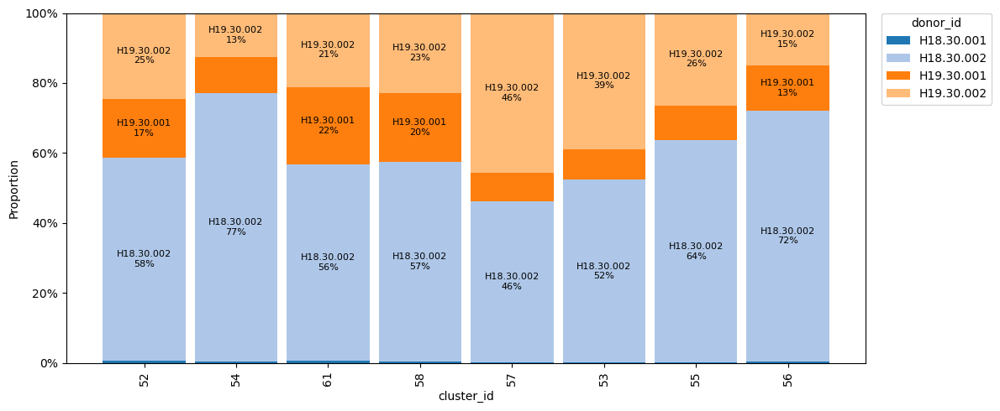

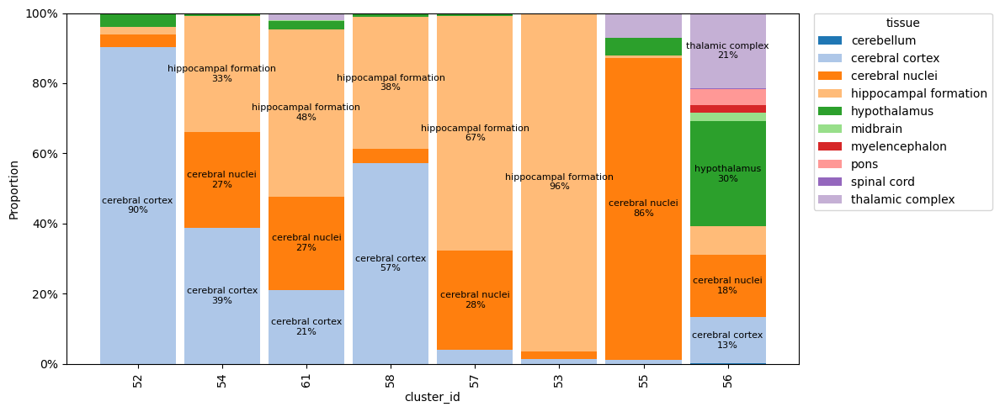

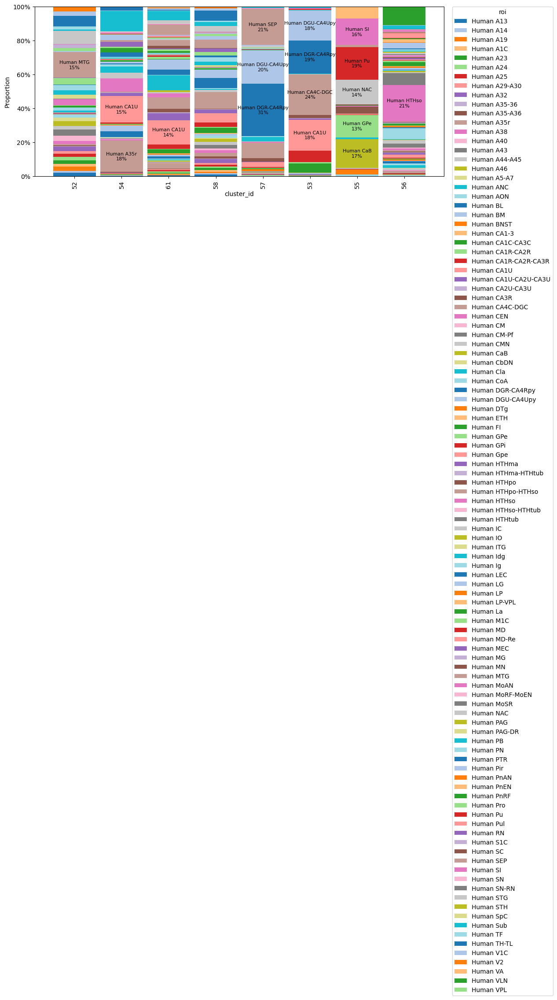

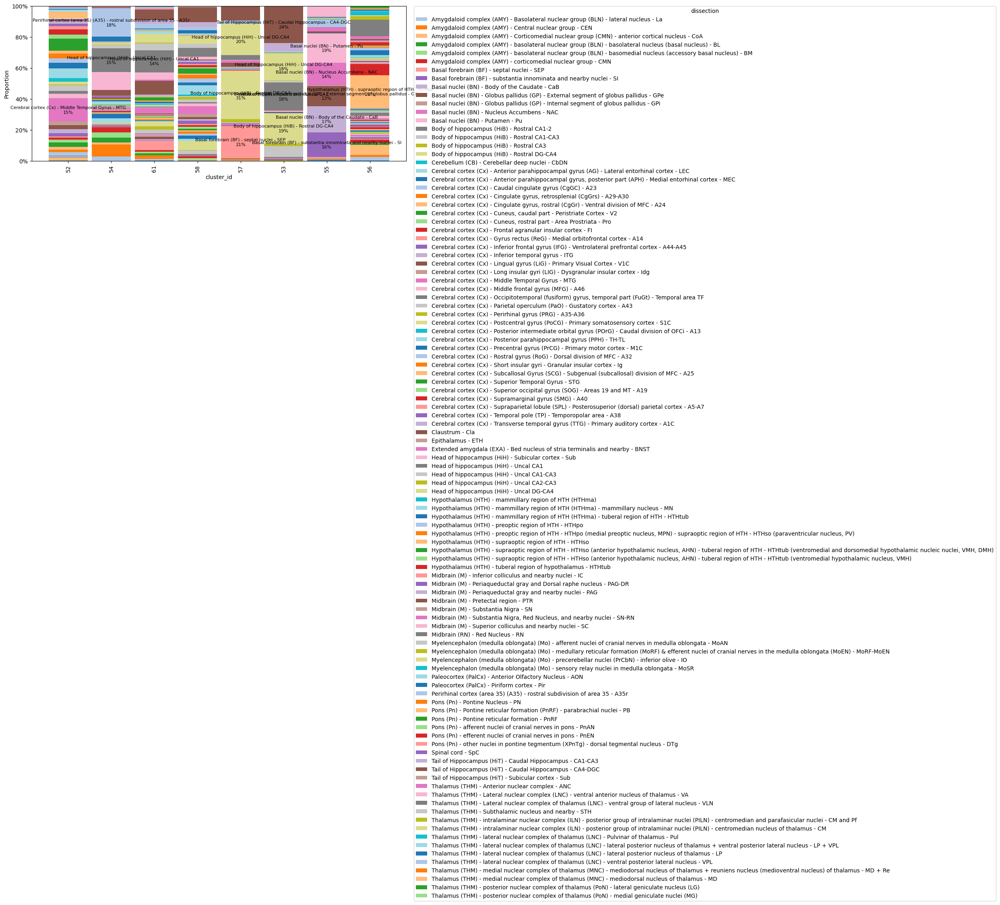

In [13]:
# 1) All clusters with proportions (recommended for composition)
pivot, (fig, ax) = plot_cluster_donor_composition(
    siletti_type1,
    cluster_key="cluster_id",   # or "cluster_id_notes"
    donor_key="donor_id",
    normalize=True,
    order="by_cluster_size",
    donor_order="alpha",
    figsize=(12, 5),
    legend_out=True
)

pivot, (fig, ax) = plot_cluster_donor_composition(
    siletti_type1,
    cluster_key="cluster_id",   # or "cluster_id_notes"
    donor_key="tissue",
    normalize=True,
    order="by_cluster_size",
    donor_order="alpha",
    figsize=(12, 5),
    legend_out=True
)

pivot, (fig, ax) = plot_cluster_donor_composition(
    siletti_type1,
    cluster_key="cluster_id",   # or "cluster_id_notes"
    donor_key="roi",
    normalize=True,
    order="by_cluster_size",
    donor_order="alpha",
    figsize=(12, 5),
    legend_out=True
)

pivot, (fig, ax) = plot_cluster_donor_composition(
    siletti_type1,
    cluster_key="cluster_id",   # or "cluster_id_notes"
    donor_key="dissection",
    normalize=True,
    order="by_cluster_size",
    donor_order="alpha",
    figsize=(12, 5),
    legend_out=True
)

In [7]:
siletti_type1

AnnData object with n_obs × n_vars = 88270 × 59236
    obs: 'roi', 'organism_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'donor_id', 'suspension_type', 'dissection', 'fraction_mitochondrial', 'fraction_unspliced', 'cell_cycle_score', 'total_genes', 'total_UMIs', 'sample_id', 'supercluster_term', 'cluster_id', 'subcluster_id', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'Type', 'cluster_id_notes'
    var: 'Biotype', 'Chromosome', 'End', 'Gene', 'Start', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'feature_label'
    uns: 'batch_condition', 'citation', 'log1p', 'schema_reference', 'schema_version', 'title'
    o

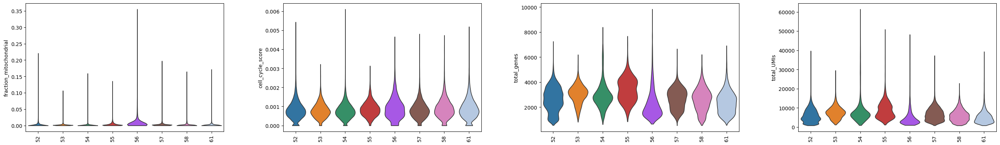

In [15]:
sc.pl.violin(
    siletti_type1,
    keys=['fraction_mitochondrial', 'cell_cycle_score', 'total_genes', 'total_UMIs'],
    groupby='cluster_id',
    rotation=90,
    stripplot=False
)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

54 vs. 55: Mann-Whitney-Wilcoxon test two-sided, P_val:1.104e-86 U_stat=3.439e+07
53 vs. 55: Mann-Whitney-Wilcoxon test two-sided, P_val:7.106e-30 U_stat=7.344e+06
52 vs. 55: Mann-Whitney-Wilcoxon test two-sided, P_val:2.474e-305 U_stat=2.802e+07


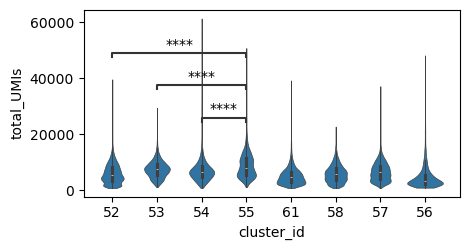

In [29]:
from scipy.stats import mannwhitneyu
from statannotations.Annotator import Annotator  # pip install statannotations

obs_col="total_UMIs"
df = siletti_type1.obs[['cluster_id', obs_col]].copy()
df['cluster_id'] = df['cluster_id'].astype(str)

fig, ax = plt.subplots(figsize=(4.8,2.6), dpi=100)
sns.violinplot(data=df, x='cluster_id', y=obs_col, ax=ax, cut=0, linewidth=0.5)


pairs = [( '55', '52'), ('55','53'), ('55','54')]  


annotator = Annotator(ax, pairs, data=df, x='cluster_id', y=obs_col)
annotator.configure(test='Mann-Whitney', text_format='star', loc='inside')
annotator.apply_and_annotate()

plt.tight_layout()

#plt.savefig("cluster_totalUMIs_violin.png", dpi=300, bbox_inches='tight')  # PNG
plt.savefig("Siletticluster_totalUMIs_violin.pdf", bbox_inches='tight')         # PDF

plt.show()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

54 vs. 55: Mann-Whitney-Wilcoxon test two-sided, P_val:8.337e-183 U_stat=3.032e+07
53 vs. 55: Mann-Whitney-Wilcoxon test two-sided, P_val:5.390e-66 U_stat=6.709e+06
52 vs. 55: Mann-Whitney-Wilcoxon test two-sided, P_val:0.000e+00 U_stat=2.712e+07


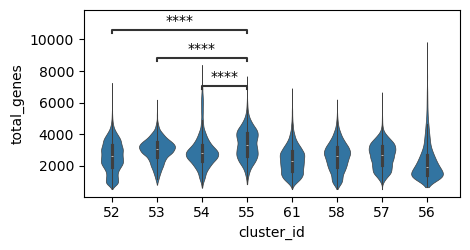

In [30]:
obs_col="total_genes"
df = siletti_type1.obs[['cluster_id', obs_col]].copy()
df['cluster_id'] = df['cluster_id'].astype(str)


fig, ax = plt.subplots(figsize=(4.8,2.6), dpi=100)
sns.violinplot(data=df, x='cluster_id', y=obs_col, ax=ax, cut=0, linewidth=0.5)


pairs = [( '55', '52'), ('55','53'), ('55','54')]  


annotator = Annotator(ax, pairs, data=df, x='cluster_id', y=obs_col)
annotator.configure(test='Mann-Whitney', text_format='star', loc='inside')
annotator.apply_and_annotate()

plt.tight_layout()

plt.savefig("Siletticluster_total_genes_violin.pdf", bbox_inches='tight') 
plt.show()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

54 vs. 55: Mann-Whitney-Wilcoxon test two-sided, P_val:1.690e-42 U_stat=3.710e+07
53 vs. 55: Mann-Whitney-Wilcoxon test two-sided, P_val:1.167e-20 U_stat=7.567e+06
52 vs. 55: Mann-Whitney-Wilcoxon test two-sided, P_val:3.211e-19 U_stat=4.136e+07


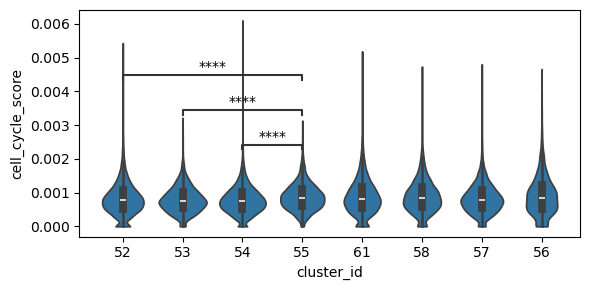

In [18]:
obs_col="cell_cycle_score"
df = siletti_type1.obs[['cluster_id', obs_col]].copy()
df['cluster_id'] = df['cluster_id'].astype(str)


fig, ax = plt.subplots(figsize=(6,3), dpi=100)
sns.violinplot(data=df, x='cluster_id', y=obs_col, ax=ax, cut=0)


pairs = [( '55', '52'), ('55','53'), ('55','54')]  


annotator = Annotator(ax, pairs, data=df, x='cluster_id', y=obs_col)
annotator.configure(test='Mann-Whitney', text_format='star', loc='inside')
annotator.apply_and_annotate()

plt.tight_layout()
plt.show()

In [31]:
siletti_type1.obs.groupby(['cluster_id', 'donor_id']).size().unstack(fill_value=0)

donor_id,H18.30.001,H18.30.002,H19.30.001,H19.30.002
cluster_id,,,,
52,203,14724,4306,6251
53,5,2511,421,1866
54,102,18529,2500,3037
55,3,2274,356,943
56,6,1201,214,251
57,16,3178,565,3166
58,30,4584,1577,1830
61,98,7636,3003,2884


In [9]:
from typing import Optional, List
from anndata import AnnData
import numpy as np
import pandas as pd

def downsample_per_cluster_donor(
    adata: AnnData,
    cluster_key: str = "Cluster",
    donor_key: str = "donor_id",
    max_cells_per_group: int = 50,
    clusters_to_include: Optional[List[str]] = None,
    require_shared_donors: bool = True,
    random_state: Optional[int] = None
) -> AnnData:
    """
    Downsample per (cluster × donor) to a maximum number of cells,
    with optional filtering to retain only donors shared across multiple clusters.
    Supports fixed random seed for reproducibility.

    Parameters
    ----------
    adata : AnnData
        Input AnnData object.
    cluster_key : str
        Column in .obs specifying clusters.
    donor_key : str
        Column in .obs specifying donor IDs.
    max_cells_per_group : int
        Maximum number of cells per (cluster × donor) group.
    clusters_to_include : list of str, optional
        Only retain these clusters if provided.
    require_shared_donors : bool
        If True, only keep donors that appear in ≥2 of the specified clusters.
    random_state : int, optional
        Seed for reproducible downsampling. If None, randomness is not fixed.

    Returns
    -------
    AnnData
        Downsampled AnnData object.
    """
    obs = adata.obs
    if clusters_to_include is not None:
        obs = obs[obs[cluster_key].isin(clusters_to_include)]

    # Identify donors present in ≥2 different clusters
    if require_shared_donors:
        donor_cluster_counts = obs.groupby(donor_key)[cluster_key].nunique()
        shared_donors = donor_cluster_counts[donor_cluster_counts >= 2].index.tolist()
        obs = obs[obs[donor_key].isin(shared_donors)]

    rng = np.random.default_rng(random_state)  # reproducible generator
    selected_indices = []

    for clus in obs[cluster_key].unique():
        clus_df = obs[obs[cluster_key] == clus]
        for donor in clus_df[donor_key].unique():
            donor_cells = clus_df[clus_df[donor_key] == donor].index.tolist()
            if len(donor_cells) <= max_cells_per_group:
                selected_indices.extend(donor_cells)
            else:
                sampled = rng.choice(donor_cells, size=max_cells_per_group, replace=False)
                selected_indices.extend(sampled)

    return adata[selected_indices].copy()


In [33]:
siletti_type1_ds = downsample_per_cluster_donor(
    siletti_type1,
    cluster_key="cluster_id",
    donor_key="donor_id",
    max_cells_per_group=1000,
    #clusters_to_include=["Human-14", "Human-7"],
    require_shared_donors=True,
    random_state=123  # reproducible
)


In [34]:
siletti_type1_ds.obs.groupby(['cluster_id', 'donor_id']).size().unstack(fill_value=0)

donor_id,H18.30.001,H18.30.002,H19.30.001,H19.30.002
cluster_id,,,,
52,203,1000,1000,1000
53,5,1000,421,1000
54,102,1000,1000,1000
55,3,1000,356,943
56,6,1000,214,251
57,16,1000,565,1000
58,30,1000,1000,1000
61,98,1000,1000,1000


In [25]:
# Create a new obs column for group assignment
siletti_type1_ds.obs['group_for_DEG'] = (
    (siletti_type1_ds.obs['cluster_id'] == '55')
    .map({True: 'C55', False: 'OtherType1'})
)


sc.tl.rank_genes_groups(
    siletti_type1_ds,
    groupby='group_for_DEG',
    reference='OtherType1',
    method='wilcoxon',
    corr_method = "benjamini-hochberg", 
    pts=True, 
    use_raw=False, 
    key_added="c55_vs_otherType1_ds"
)

# Inspect top genes
sc.pl.rank_genes_groups(siletti_type1_ds, n_genes=25, sharey=False, key="c55_vs_otherType1_ds")


KeyError: 'rank_genes_groups'

In [27]:
print(siletti_type1_ds.uns["c55_vs_otherType1_ds"]["names"].dtype.names)
all_groups = siletti_type1_ds.uns["c55_vs_otherType1_ds"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(siletti_type1_ds, group=grp, key='c55_vs_otherType1_ds').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
df_all.to_csv(work_dir + "/rank_genes_groups_c55_vs_otherType1_ds_inSiletti.csv", index=False)

('C55',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,SLC8A1_ENSG00000183023,52.810795,6.049505,0.000000e+00,0.000000e+00,0.868375,C55
1,GRID2_ENSG00000152208,52.516079,5.810499,0.000000e+00,0.000000e+00,0.941355,C55
2,SHTN1_ENSG00000187164,45.685997,5.385801,0.000000e+00,0.000000e+00,0.716334,C55
3,EPHA6_ENSG00000080224,43.420952,4.158300,0.000000e+00,0.000000e+00,0.923110,C55
4,PIK3C2A_ENSG00000011405,43.062038,3.498989,0.000000e+00,0.000000e+00,0.933102,C55
5,GRM3_ENSG00000198822,42.301743,4.389699,0.000000e+00,0.000000e+00,0.965248,C55
6,APOC1_ENSG00000130208,42.080719,5.446691,0.000000e+00,0.000000e+00,0.629018,C55
7,LRMDA_ENSG00000148655,41.557003,4.642654,0.000000e+00,0.000000e+00,0.809731,C55
8,FSTL5_ENSG00000168843,40.794647,4.380519,0.000000e+00,0.000000e+00,0.788445,C55
9,GABRA4_ENSG00000109158,37.727955,5.059170,0.000000e+00,0.000000e+00,0.567333,C55


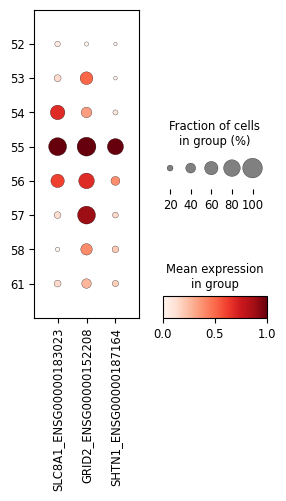

In [31]:
sc.pl.dotplot(siletti_type1, 
              ['SLC8A1_ENSG00000183023', 'GRID2_ENSG00000152208', 'SHTN1_ENSG00000187164'], 
              groupby='cluster_id', 
              standard_scale='var',#'var',
              use_raw=False, 
              swap_axes=False, 
              figsize=(3,4),
             # save="dotplot_NTN1_in_MarmosetSpatialTx_Astro_Clusters.pdf" 
) 

#### why STR astro distinct from Type1 GM?

In [6]:
siletti_type1.obs['cluster_id'] = siletti_type1.obs['cluster_id'].astype(str)

keep_clusters = ['52', '53', '54', '55'] #GM 
siletti_type1GM = siletti_type1[siletti_type1.obs['cluster_id'].isin(keep_clusters)].copy()


In [10]:
siletti_type1GM_ds = downsample_per_cluster_donor(
    siletti_type1GM,
    cluster_key="cluster_id",
    donor_key="donor_id",
    max_cells_per_group=1000,
    #clusters_to_include=["Human-14", "Human-7"],
    require_shared_donors=True,
    random_state=123  # reproducible
)


In [11]:
siletti_type1GM_ds.obs.groupby(['cluster_id', 'donor_id']).size().unstack(fill_value=0)

donor_id,H18.30.001,H18.30.002,H19.30.001,H19.30.002
cluster_id,,,,
52,203,1000,1000,1000
53,5,1000,421,1000
54,102,1000,1000,1000
55,3,1000,356,943


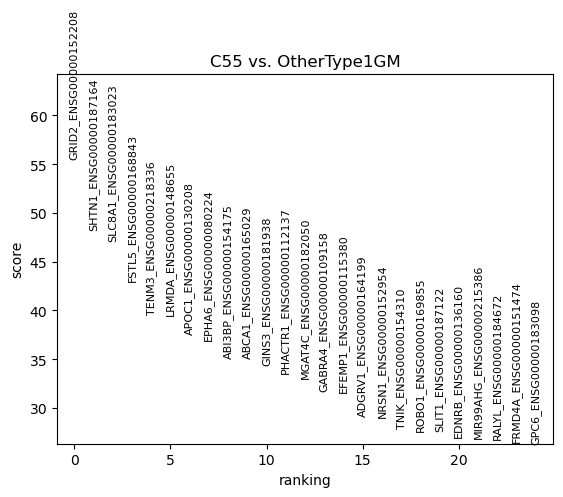

In [12]:
# Create a new obs column for group assignment
siletti_type1GM_ds.obs['group_for_DEG'] = (
    (siletti_type1GM_ds.obs['cluster_id'] == '55')
    .map({True: 'C55', False: 'OtherType1GM'})
)


sc.tl.rank_genes_groups(
    siletti_type1GM_ds,
    groupby='group_for_DEG',
    reference='OtherType1GM',
    method='wilcoxon',
    corr_method = "benjamini-hochberg", 
    pts=True, 
    use_raw=False, 
    key_added="c55_vs_otherType1GM_ds"
)

# Inspect top genes
sc.pl.rank_genes_groups(siletti_type1GM_ds, n_genes=25, sharey=False, key="c55_vs_otherType1GM_ds")


In [13]:
print(siletti_type1GM_ds.uns["c55_vs_otherType1GM_ds"]["names"].dtype.names)
all_groups = siletti_type1GM_ds.uns["c55_vs_otherType1GM_ds"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(siletti_type1GM_ds, group=grp, key='c55_vs_otherType1GM_ds').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
df_all.to_csv(work_dir + "/rank_genes_groups_c55_vs_otherType1GM_ds_inSiletti.csv", index=False)

('C55',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,GRID2_ENSG00000152208,55.488094,7.228801,0.000000e+00,0.000000e+00,0.941355,C55
1,SHTN1_ENSG00000187164,48.276653,6.569643,0.000000e+00,0.000000e+00,0.716334,C55
2,SLC8A1_ENSG00000183023,47.127121,5.596327,0.000000e+00,0.000000e+00,0.868375,C55
3,FSTL5_ENSG00000168843,43.029335,4.995918,0.000000e+00,0.000000e+00,0.788445,C55
4,TENM3_ENSG00000218336,39.668648,5.036120,0.000000e+00,0.000000e+00,0.681147,C55
5,LRMDA_ENSG00000148655,39.519463,4.563325,0.000000e+00,0.000000e+00,0.809731,C55
6,APOC1_ENSG00000130208,37.602345,4.900074,1.968233e-309,1.059912e-305,0.629018,C55
7,EPHA6_ENSG00000080224,36.939102,3.353711,1.089674e-298,5.378992e-295,0.923110,C55
8,ABI3BP_ENSG00000154175,35.115116,4.843778,3.963285e-270,1.750903e-266,0.585143,C55
9,ABCA1_ENSG00000165029,35.113888,2.983720,4.138132e-270,1.750903e-266,0.874891,C55


In [41]:
hits = (
    df_all.query("group == 'C55'")
        .loc[lambda d: (d['logfoldchanges'] > 0.5) &
                        (d['pvals_adj'] < 0.01) &
                        (d['pct_nz_group'] > 0.1)]
        .sort_values(['scores', 'logfoldchanges'], ascending=[False, False])
)

# show a preview and save
display(hits.head(30)) #3519 genes

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,GRID2_ENSG00000152208,55.488094,7.228801,0.000000e+00,0.000000e+00,0.941355,C55
1,SHTN1_ENSG00000187164,48.276653,6.569643,0.000000e+00,0.000000e+00,0.716334,C55
2,SLC8A1_ENSG00000183023,47.127121,5.596327,0.000000e+00,0.000000e+00,0.868375,C55
3,FSTL5_ENSG00000168843,43.029335,4.995918,0.000000e+00,0.000000e+00,0.788445,C55
4,TENM3_ENSG00000218336,39.668648,5.036120,0.000000e+00,0.000000e+00,0.681147,C55
5,LRMDA_ENSG00000148655,39.519463,4.563325,0.000000e+00,0.000000e+00,0.809731,C55
6,APOC1_ENSG00000130208,37.602345,4.900074,1.968233e-309,1.059912e-305,0.629018,C55
7,EPHA6_ENSG00000080224,36.939102,3.353711,1.089674e-298,5.378992e-295,0.923110,C55
8,ABI3BP_ENSG00000154175,35.115116,4.843778,3.963285e-270,1.750903e-266,0.585143,C55
9,ABCA1_ENSG00000165029,35.113888,2.983720,4.138132e-270,1.750903e-266,0.874891,C55


In [14]:
hits_up = (
    df_all.query("group == 'C55'")
        .loc[lambda d: (d['logfoldchanges'] > 1) &
                        (d['pvals_adj'] < 0.01) &
                        (d['pct_nz_group'] > 0.2)]
        .sort_values(['scores', 'logfoldchanges'], ascending=[False, False])
)

# show a preview and save
hits_up['gene'] = hits_up['names'].str.split('_').str[0]
display(hits_up.head(30)) #679
hits_up.to_csv( "C55_up_sig_679genes_filtered.csv", index=False)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group,gene
0,GRID2_ENSG00000152208,55.488094,7.228801,0.000000e+00,0.000000e+00,0.941355,C55,GRID2
1,SHTN1_ENSG00000187164,48.276653,6.569643,0.000000e+00,0.000000e+00,0.716334,C55,SHTN1
2,SLC8A1_ENSG00000183023,47.127121,5.596327,0.000000e+00,0.000000e+00,0.868375,C55,SLC8A1
3,FSTL5_ENSG00000168843,43.029335,4.995918,0.000000e+00,0.000000e+00,0.788445,C55,FSTL5
4,TENM3_ENSG00000218336,39.668648,5.036120,0.000000e+00,0.000000e+00,0.681147,C55,TENM3
5,LRMDA_ENSG00000148655,39.519463,4.563325,0.000000e+00,0.000000e+00,0.809731,C55,LRMDA
6,APOC1_ENSG00000130208,37.602345,4.900074,1.968233e-309,1.059912e-305,0.629018,C55,APOC1
7,EPHA6_ENSG00000080224,36.939102,3.353711,1.089674e-298,5.378992e-295,0.923110,C55,EPHA6
8,ABI3BP_ENSG00000154175,35.115116,4.843778,3.963285e-270,1.750903e-266,0.585143,C55,ABI3BP
9,ABCA1_ENSG00000165029,35.113888,2.983720,4.138132e-270,1.750903e-266,0.874891,C55,ABCA1


In [15]:
hits_down = (
    df_all.query("group == 'C55'")
        .loc[lambda d: (d['logfoldchanges'] < -1) &
                        (d['pvals_adj'] < 0.01)] # &(d['pct_nz_group'] > 0.2)
        .sort_values(['scores', 'logfoldchanges'], ascending=[False, False])
)

# show a preview and save
hits_down['gene'] = hits_down['names'].str.split('_').str[0]
display(hits_down.head(30)) #129
hits_down.to_csv("C55_Down_sig_129genes_filtered.csv", index=False)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group,gene
58818,PTPRE_ENSG00000132334,-3.416870,-1.353943,6.334549e-04,0.009279,0.043875,C55,PTPRE
58820,RIN3_ENSG00000100599,-3.424561,-1.212320,6.157941e-04,0.009038,0.047785,C55,RIN3
58821,MSX1_ENSG00000163132,-3.426823,-1.556121,6.106876e-04,0.008970,0.030843,C55,MSX1
58823,CERCAM_ENSG00000167123,-3.438007,-1.167406,5.860115e-04,0.008637,0.051694,C55,CERCAM
58824,PTH1R_ENSG00000160801,-3.439512,-1.032710,5.827645e-04,0.008594,0.063423,C55,PTH1R
58831,STARD4_ENSG00000164211,-3.473301,-1.162928,5.140977e-04,0.007671,0.051260,C55,STARD4
58846,FABP7_ENSG00000164434,-3.650249,-1.211724,2.619862e-04,0.004164,0.050391,C55,FABP7
58852,CAMK2A_ENSG00000070808,-3.695139,-1.551967,2.197667e-04,0.003559,0.036056,C55,CAMK2A
58854,AC087477.2_ENSG00000259275,-3.727247,-1.717265,1.935823e-04,0.003169,0.029105,C55,AC087477.2
58858,NPNT_ENSG00000168743,-3.777923,-1.510571,1.581419e-04,0.002633,0.036056,C55,NPNT


In [16]:
hits_up  = hits_up.assign(direction='striatal_astro_up')    
hits_down = hits_down.assign(direction='striatal_astro_down')  

hits_all = pd.concat([hits_up, hits_down], ignore_index=True)

In [17]:
hits_all['names']

0           GRID2_ENSG00000152208
1           SHTN1_ENSG00000187164
2          SLC8A1_ENSG00000183023
3           FSTL5_ENSG00000168843
4           TENM3_ENSG00000218336
                  ...            
803         PDE3B_ENSG00000152270
804          SGCD_ENSG00000170624
805        CTNNA2_ENSG00000066032
806    AL137139.2_ENSG00000286757
807          RYR3_ENSG00000198838
Name: names, Length: 808, dtype: object

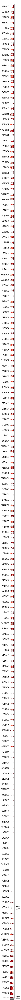

In [98]:
sc.pl.dotplot(
    siletti_type1GM_ds,
    var_names=hits_all['names'],
    groupby="cluster_id",
    use_raw=False,
    layer=None,
    standard_scale="var",  
   # save="_C55_gene_list_dotplot.png",
    swap_axes=True
)


/scratch/fast/3602121/ipykernel_3896823/2051255348.py:27: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


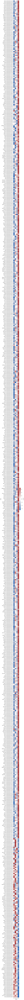

In [102]:
from scipy import sparse

# Select genes from hits_all that exist in the AnnData object
genes = [g for g in hits_all['names'] if g in siletti_type1GM_ds.var_names]

# Extract expression matrix for the selected genes
X = siletti_type1GM_ds[:, genes].X
if sparse.issparse(X):
    X = X.A  # convert to dense array if sparse

# Group cells by cluster_id and compute mean expression per cluster
clusters = siletti_type1GM_ds.obs['cluster_id'].astype(str)
df_expr = pd.DataFrame(X, index=siletti_type1GM_ds.obs_names, columns=genes)
group_means = df_expr.groupby(clusters).mean()

# Standardize (z-score) each gene across clusters (column-wise in group_means)
df_z = (group_means - group_means.mean()) / group_means.std(ddof=0)

# Transpose so that rows = genes and columns = clusters
df_z_T = df_z.T

# Plot heatmap
plt.figure(figsize=(len(group_means)/2, len(genes)/3))  # adjust figure size: width, height
sns.heatmap(df_z_T, cmap='vlag', center=0, cbar_kws={'label': 'z-score'})
plt.xlabel("Cluster")
plt.ylabel("Gene")
plt.tight_layout()

# Save figure if needed
# plt.savefig(work_dir + "/C55_gene_list_groupmean_heatmap_genes_as_rows.png", dpi=300)

plt.show()


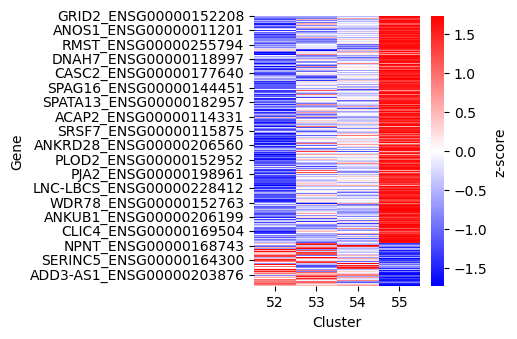

In [115]:
from scipy import sparse

# Select genes from hits_all that exist in the AnnData object
genes = [g for g in hits_all['names'] if g in siletti_type1GM.var_names]

# Extract expression matrix for the selected genes
X = siletti_type1GM[:, genes].X ## not downsampled siletti_type1GM_ds
if sparse.issparse(X):
    X = X.A  # convert to dense array if sparse

# Group cells by cluster_id and compute mean expression per cluster
clusters = siletti_type1GM.obs['cluster_id'].astype(str)
df_expr = pd.DataFrame(X, index=siletti_type1GM.obs_names, columns=genes)
group_means = df_expr.groupby(clusters).mean()

# Standardize (z-score) each gene across clusters (column-wise in group_means)
df_z = (group_means - group_means.mean()) / group_means.std(ddof=0)

# Transpose so that rows = genes and columns = clusters
df_z_T = df_z.T

# Plot heatmap
plt.figure(figsize=(5,3.5))  # adjust figure size: width, height
sns.heatmap(df_z_T, cmap='bwr', center=0, cbar_kws={'label': 'z-score'})
plt.xlabel("Cluster")
plt.ylabel("Gene")
plt.tight_layout()

# Save figure if needed
plt.savefig("C55_gene_list_groupmean_heatmap_genes_as_rows.pdf")

plt.show()


#### GO plots for UP and Down-regulated Genes in C55 (compared to other TE_GM clusters)

In [66]:
from pathlib import Path

# ---------------------------
# Read & filter a Metascape GO sheet (keeps set_size, filters range)
# ---------------------------
def load_go(path: Path) -> pd.DataFrame:
    """
    Read a Metascape 'Enrichment' sheet and return:
      Description | score (-LogP) | set_size
    Filters out terms whose set_size < 50 or > 560.
    If a term appears multiple times, keep the row with the highest score.
    """
    df = pd.read_excel(path, sheet_name="Enrichment")
    df = df[df["GroupID"].str.match(r"\d+_Summary") &
            (df["Category"] == "GO Biological Processes")].copy()

    # optional: p-value cutoff (LogP ≤ -3.8 means p ≥ 10^-3.8)
    df = df[(df["LogP"] <= -3.8)].copy()

    df["score"] = -df["LogP"]  # color: -log10(P)
    df = df.sort_values(["Description", "score"], ascending=[True, False])\
           .drop_duplicates(subset=["Description"], keep="first")

    df["set_size"] = pd.to_numeric(df["set_size"], errors="coerce")
    df = df[(df["set_size"] >= 50) & (df["set_size"] <= 560)].copy()

    return df[["Description", "score", "set_size"]]

# ---------------------------
# Build the term universe
# ---------------------------
def build_universe(dfs: dict[str, pd.DataFrame], top_n: int | None = 15) -> pd.Index:
    pieces = []
    for _, dd in dfs.items():
        block = dd.sort_values("score", ascending=False)
        if top_n is not None:
            block = block.head(top_n)
        pieces.append(block["Description"])
    return pd.Index(pd.concat(pieces).drop_duplicates())

# ---------------------------
# Assemble matrices for color (score) and size (raw set_size)
# ---------------------------
def to_matrices(dfs: dict[str, pd.DataFrame], universe: pd.Index) -> tuple[pd.DataFrame, pd.DataFrame]:
    aligned_score, aligned_size = {}, {}
    for name, dd in dfs.items():
        base = dd.set_index("Description").reindex(universe)
        aligned_score[name] = base["score"]
        aligned_size[name] = base["set_size"]  # raw set_size
    return (
        pd.DataFrame(aligned_score, index=universe),
        pd.DataFrame(aligned_size,  index=universe),
    )

# ---------------------------
# Row order for TWO groups only
# ---------------------------
def order_terms_two_groups(
    mat_score: pd.DataFrame,
    group_order: tuple[str, str],
    min_score_for_presence: float = 0.0
) -> pd.Index:
    a, b = group_order
    assert list(mat_score.columns) == [a, b], f"Columns must be exactly [{a!r}, {b!r}] in this order."

    pres = mat_score.fillna(-np.inf) >= min_score_for_presence
    pa, pb = pres[a], pres[b]

    blkA =  pa & ~pb       # A only
    blkAB = pa &  pb       # shared
    blkB = ~pa &  pb       # B only

    def sort_block(mask: pd.Series) -> pd.Index:
        idx = mat_score.index[mask]
        return mat_score.loc[idx].max(axis=1).sort_values(ascending=False).index

    ordered = list(sort_block(blkA)) + list(sort_block(blkAB)) + list(sort_block(blkB))

    seen, out = set(), []
    for t in ordered:
        if t not in seen:
            out.append(t); seen.add(t)
    return pd.Index(out)

# ---------------------------
# Plot for two groups: color = score (-log10P), size = raw set_size × multiplier
# ---------------------------
def plot_go_dot_two_groups(
    mat_score: pd.DataFrame,
    mat_size: pd.DataFrame,
    group_order: tuple[str, str],
    pdf_path: str = "./figures/GO_dotplot_two_groups.pdf",
    min_score_for_presence: float = 0.0,
    size_multiplier: float = 0.5,
    cmap_choice: str = "viridis",
    left_margin: float = 0.60,
    x_labelsize: int = 9,
    y_labelsize: int = 11,
    figsize: tuple[float, float] | None = None,
    dpi: int | None = 300,
    row_height: float = 0.26,
    base_height: float = 1.5,
    fig_width: float = 4.2,
):
    row_order = order_terms_two_groups(
        mat_score, group_order=group_order, min_score_for_presence=min_score_for_presence
    )
    mat_score = mat_score.loc[row_order, list(group_order)]
    mat_size  = mat_size.loc[row_order,  list(group_order)]

    if figsize is None:
        h = row_height * len(mat_score) + base_height
        w = fig_width
        fig, ax = plt.subplots(figsize=(w, h), dpi=dpi)
    else:
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    x_labels = mat_score.columns.tolist()
    y_labels = mat_score.index.tolist()
    x = np.arange(len(x_labels))
    y = np.arange(len(y_labels))
    X, Y = np.meshgrid(x, y)

    vals_color = mat_score.values
    vals_size  = mat_size.values
    mask = ~np.isnan(vals_color)
    xx, yy = X[mask].ravel(), Y[mask].ravel()
    cc = vals_color[mask].ravel()
    ss_raw = vals_size[mask].ravel()

    sizes = size_multiplier * ss_raw

    sc = ax.scatter(xx, yy, s=sizes, c=cc, cmap=cmap_choice,
                    vmin=float(np.nanmin(vals_color)), vmax=float(np.nanmax(vals_color)),
                    rasterized=True)

    ax.set_xticks(x, x_labels)
    ax.set_yticks(y, y_labels)
    ax.tick_params(axis='x', labelsize=x_labelsize)
    ax.tick_params(axis='y', labelsize=y_labelsize)
    ax.invert_yaxis()
    ax.grid(axis="x", linestyle=":", alpha=0.25)
    ax.set_xlim(-0.5, len(x_labels) - 0.5)
    ax.set_ylim(len(y_labels) - 0.5, -0.5)
    ax.set_xlabel("Gene set", fontsize=x_labelsize + 1)
    ax.set_ylabel("GO Biological Process", fontsize=y_labelsize + 1)

    cbar = plt.colorbar(sc, ax=ax, pad=0.02)
    cbar.set_label(r"$-\log_{10}(P)$", fontsize=x_labelsize + 1)
    cbar.ax.tick_params(labelsize=x_labelsize)

    plt.subplots_adjust(left=left_margin, right=0.96, top=0.98, bottom=0.08)
    plt.savefig(pdf_path, bbox_inches="tight", dpi=dpi)
    plt.show()



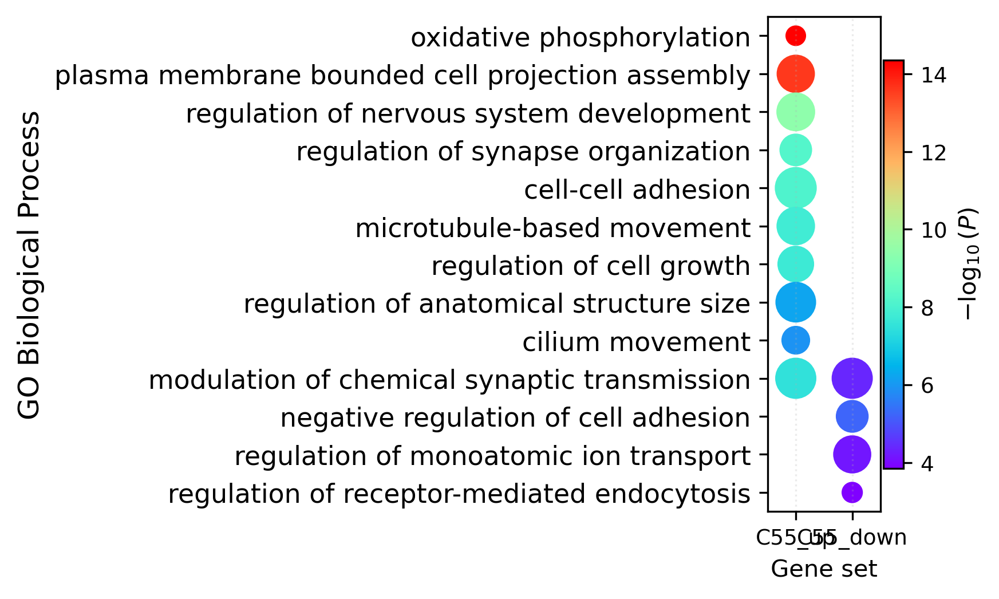

In [67]:
work_dir = Path(work_dir)

dfs = {
    "C55_up":   load_go(work_dir / "GO_fig5/GO_fig5_silettiC55up679genes_metascape_result.xlsx"),
    "C55_down": load_go(work_dir / "GO_fig5/GO_fig5_silettiC55down129genes_metascape_result.xlsx"),
}

universe = build_universe(dfs, top_n=30)
mat_score, mat_size = to_matrices(dfs, universe)

plot_go_dot_two_groups(mat_score, mat_size,
                       group_order=("C55_up","C55_down"),
                         pdf_path="./GO_dotplot_c55_up_down.pdf",
                         size_multiplier=0.5,
                         cmap_choice="rainbow",
                         figsize=(2.2, 3.2),  
                         dpi=300)

### mouse ABC atlas

In [ ]:
## cluster_id_label #anatomical_annotation (Yao et al, 2023 Nature - Supp_Table 7)

 # '5218 Astro-TE NN_1',  CTX pia sparse (drop - only CTX pia and sparse)
 # '5219 Astro-TE NN_1',  pia and fiber tract & may clean up more (keep - TE ILA; also highlighted in paper)
 # '5220 Astro-TE NN_1',  CTX pia sparse (drop)
 # '5221 Astro-TE NN_1',  CTX pia sparse (drop)

 # '5222 Astro-TE NN_2',  DG RGL-like(keep as contrast so that we cover all the supertypes)
 # '5223 Astro-TE NN_2',  DG cycling(drop -HIP)
 # '5224 Astro-TE NN_3',  enriched in LSX, HIP, DP-TT & may clean up more (drop)
 # '5225 Astro-TE NN_3',  Isocortex, OLF (keep as CTX GM contrast)
 # '5226 Astro-TE NN_3',  LSX and midline (keep - LSX belongs to STR in mice)
 # '5227 Astro-TE NN_3',  STRd (keep)
 # '5228 Astro-TE NN_4',  HIP/CTXsp (keep as contrast)
 # '5229 Astro-TE NN_5',  SVZ STRd AON (keep) RMS
 # '5230 Astro-TE NN_5'   SVZ STRd me;SVZ RGL-like (keep) RMS

In [18]:
## Helpful locations which are assumed to already exist
data_dir = f"/allen/programs/celltypes/workgroups/rnaseqanalysis/HMBA/Aim1_Atlases/Human/BasalGanglia/analysis/data_input/mouseABC" 

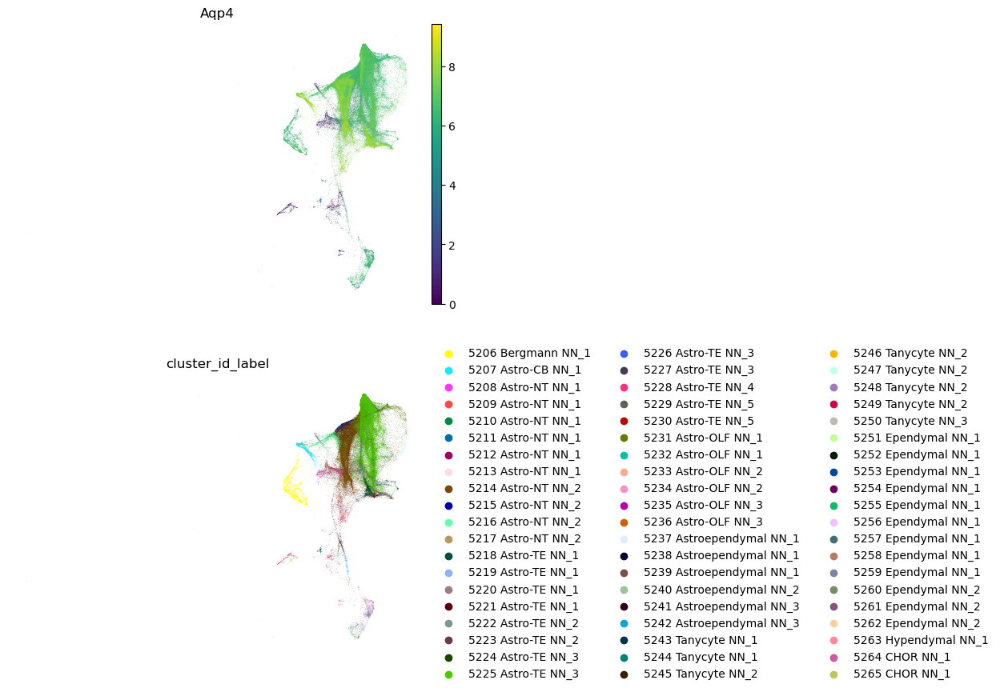

In [19]:
mouse = sc.read_h5ad(data_dir + "/AIT21_10Xv2v3.norm.30Astro-Epen.class.h5ad")

sc.pl.embedding(
    mouse,
    basis="EMBED3",
    color=['Aqp4', 'cluster_id_label'],#'roi', 
    frameon=False,
    ncols=1
)

In [119]:
print(set(mouse.obs['subclass_id_label']))
print(set(mouse.obs['cluster_id_label']))

{'321 Astroependymal NN', '324 Hypendymal NN', '319 Astro-TE NN', '322 Tanycyte NN', '325 CHOR NN', '317 Astro-CB NN', '318 Astro-NT NN', '320 Astro-OLF NN', '323 Ependymal NN', '316 Bergmann NN'}
{'5248 Tanycyte NN_2', '5243 Tanycyte NN_1', '5218 Astro-TE NN_1', '5245 Tanycyte NN_2', '5229 Astro-TE NN_5', '5225 Astro-TE NN_3', '5207 Astro-CB NN_1', '5261 Ependymal NN_2', '5260 Ependymal NN_2', '5236 Astro-OLF NN_3', '5213 Astro-NT NN_1', '5208 Astro-NT NN_1', '5263 Hypendymal NN_1', '5234 Astro-OLF NN_2', '5246 Tanycyte NN_2', '5216 Astro-NT NN_2', '5217 Astro-NT NN_2', '5231 Astro-OLF NN_1', '5235 Astro-OLF NN_3', '5237 Astroependymal NN_1', '5252 Ependymal NN_1', '5255 Ependymal NN_1', '5224 Astro-TE NN_3', '5212 Astro-NT NN_1', '5226 Astro-TE NN_3', '5214 Astro-NT NN_2', '5258 Ependymal NN_1', '5251 Ependymal NN_1', '5222 Astro-TE NN_2', '5211 Astro-NT NN_1', '5242 Astroependymal NN_3', '5209 Astro-NT NN_1', '5210 Astro-NT NN_1', '5241 Astroependymal NN_3', '5232 Astro-OLF NN_1', '

In [20]:
# Subset only mouse_TE
mouse_TE = mouse[mouse.obs['subclass_id_label'] == '319 Astro-TE NN'].copy()
print(mouse_TE.obs['cluster_id_label'].value_counts())
mouse_TE


cluster_id_label
5225 Astro-TE NN_3    131046
5226 Astro-TE NN_3      7734
5227 Astro-TE NN_3      7503
5218 Astro-TE NN_1      2759
5221 Astro-TE NN_1      1225
5228 Astro-TE NN_4       982
5229 Astro-TE NN_5       773
5219 Astro-TE NN_1       647
5230 Astro-TE NN_5       564
5224 Astro-TE NN_3       523
5222 Astro-TE NN_2       413
5220 Astro-TE NN_1       132
5223 Astro-TE NN_2        10
Name: count, dtype: int64


AnnData object with n_obs × n_vars = 154311 × 32285
    obs: 'library_prep', 'gene.counts.0', 'doublet_score', 'roi', 'umi.counts', 'method', 'sex', 'external_donor_name', 'age', 'medical_conditions', 'cl', 'region_label', 'cluster_id', 'cluster_id_label', 'supertype_id', 'supertype_label', 'supertype_id_label', 'subclass_id', 'subclass_label', 'subclass_id_label', 'class_id', 'class_label', 'class_id_label', 'neighborhood7', '10x_platform'
    uns: 'log1p', 'region_label_colors', 'roi_colors', 'cluster_id_label_colors'
    obsm: 'X_EMBED2', 'X_EMBED3'
    layers: 'UMIs'

In [124]:
print(set(mouse_TE.obs['supertype_id_label']))

{'1163 Astro-TE NN_3', '1161 Astro-TE NN_1', '1164 Astro-TE NN_4', '1165 Astro-TE NN_5', '1162 Astro-TE NN_2'}


In [21]:
# Subset only mouse_TE_GM
# print(set(mouse_TE.obs['supertype_id_label']))
mouse_TEgm = mouse_TE[mouse_TE.obs['supertype_id_label'] != '1161 Astro-TE NN_1'].copy()
print(mouse_TEgm.obs['cluster_id_label'].value_counts())
mouse_TEgm


cluster_id_label
5225 Astro-TE NN_3    131046
5226 Astro-TE NN_3      7734
5227 Astro-TE NN_3      7503
5228 Astro-TE NN_4       982
5229 Astro-TE NN_5       773
5230 Astro-TE NN_5       564
5224 Astro-TE NN_3       523
5222 Astro-TE NN_2       413
5223 Astro-TE NN_2        10
Name: count, dtype: int64


AnnData object with n_obs × n_vars = 149548 × 32285
    obs: 'library_prep', 'gene.counts.0', 'doublet_score', 'roi', 'umi.counts', 'method', 'sex', 'external_donor_name', 'age', 'medical_conditions', 'cl', 'region_label', 'cluster_id', 'cluster_id_label', 'supertype_id', 'supertype_label', 'supertype_id_label', 'subclass_id', 'subclass_label', 'subclass_id_label', 'class_id', 'class_label', 'class_id_label', 'neighborhood7', '10x_platform'
    uns: 'log1p', 'region_label_colors', 'roi_colors', 'cluster_id_label_colors'
    obsm: 'X_EMBED2', 'X_EMBED3'
    layers: 'UMIs'

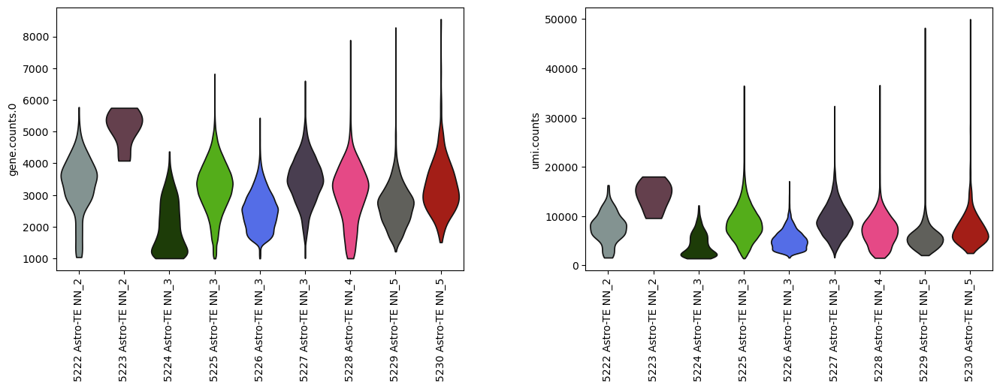

In [126]:
sc.pl.violin(
    mouse_TEgm,
    keys=['gene.counts.0', 'umi.counts'],
    groupby='cluster_id_label',
    rotation=90,
    stripplot=False
)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

5225 Astro-TE NN_3 vs. 5227 Astro-TE NN_3: Mann-Whitney-Wilcoxon test two-sided, P_val:4.082e-114 U_stat=4.151e+08


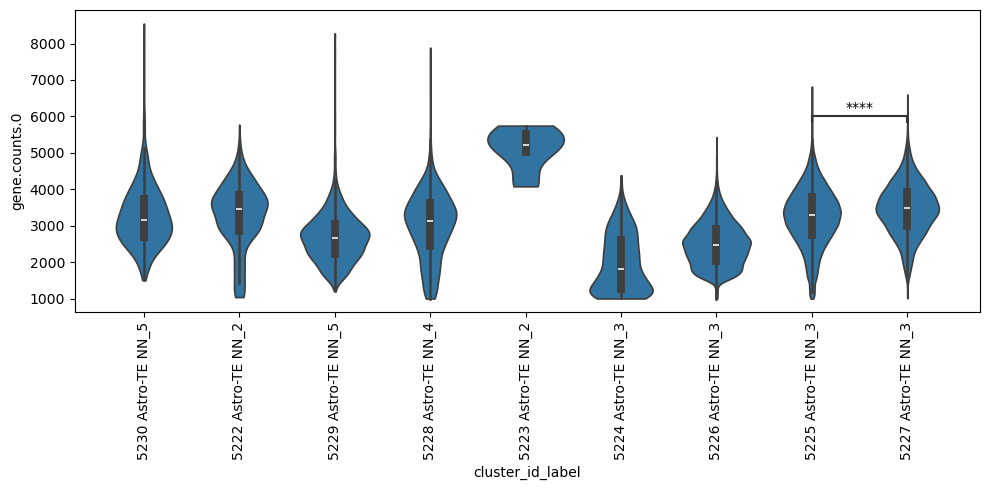

In [129]:
from scipy.stats import mannwhitneyu
from statannotations.Annotator import Annotator  # pip install statannotations


df = mouse_TEgm.obs[['cluster_id_label', 'gene.counts.0']].copy()
df['cluster_id_label'] = df['cluster_id_label'].astype(str)


fig, ax = plt.subplots(figsize=(10,5))
sns.violinplot(data=df, x='cluster_id_label', y='gene.counts.0', ax=ax, cut=0)

# rotate x-axis labels 90°
for label in ax.get_xticklabels():
    label.set_rotation(90)
    label.set_ha('center')   # or 'right' if labels are long

pairs = [('5225 Astro-TE NN_3', '5227 Astro-TE NN_3')]
annotator = Annotator(ax, pairs, data=df, x='cluster_id_label', y='gene.counts.0')
annotator.configure(test='Mann-Whitney', text_format='star', loc='inside')
annotator.apply_and_annotate()

plt.tight_layout()
plt.show()


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

5225 Astro-TE NN_3 vs. 5227 Astro-TE NN_3: Mann-Whitney-Wilcoxon test two-sided, P_val:5.787e-76 U_stat=4.295e+08


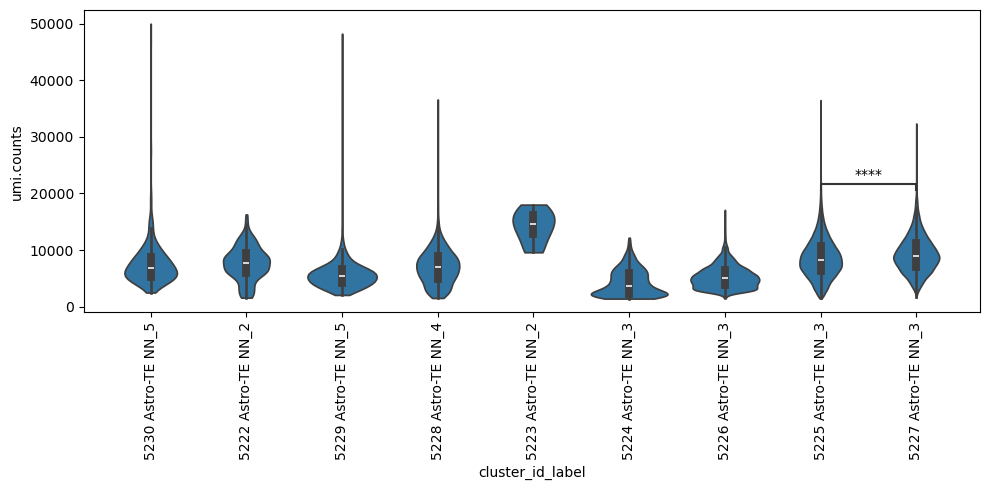

In [131]:
df = mouse_TEgm.obs[['cluster_id_label', 'umi.counts']].copy()
df['cluster_id_label'] = df['cluster_id_label'].astype(str)


fig, ax = plt.subplots(figsize=(10,5))
sns.violinplot(data=df, x='cluster_id_label', y='umi.counts', ax=ax, cut=0)

# rotate x-axis labels 90°
for label in ax.get_xticklabels():
    label.set_rotation(90)
    label.set_ha('center')   # or 'right' if labels are long

pairs = [('5225 Astro-TE NN_3', '5227 Astro-TE NN_3')]
annotator = Annotator(ax, pairs, data=df, x='cluster_id_label', y='umi.counts')
annotator.configure(test='Mann-Whitney', text_format='star', loc='inside')
annotator.apply_and_annotate()

plt.tight_layout()
plt.show()

In [22]:
mouse_TEgm.obs.groupby(['cluster_id_label', 'external_donor_name']).size().unstack(fill_value=0)

external_donor_name,352353,352356,352357,355877,355878,365616,365617,365619,366292,366676,...,563792,565823,565913,568464,568465,568762,569504,574606,619870,621471
cluster_id_label,,,,,,,,,,,,,,,,,,,,,
5222 Astro-TE NN_2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,0,0,0,0,0,0
5223 Astro-TE NN_2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5224 Astro-TE NN_3,0,0,1,0,1,0,1,3,0,25,...,0,0,0,13,44,0,0,0,0,0
5225 Astro-TE NN_3,139,168,124,1,64,4,76,32,5,95,...,0,993,956,48,33,1,2,9,38,8
5226 Astro-TE NN_3,0,0,1,0,1,0,0,0,0,2,...,4,2,1,1613,1346,0,0,0,0,0
5227 Astro-TE NN_3,0,0,1,0,0,0,0,0,0,1,...,1,2,3,27,38,0,0,2,0,0
5228 Astro-TE NN_4,0,0,0,0,1,0,0,0,0,0,...,0,33,1,1,1,0,0,2,0,0
5229 Astro-TE NN_5,0,0,0,0,0,0,0,0,0,0,...,1,8,0,9,11,0,0,1,0,0
5230 Astro-TE NN_5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,18,28,0,0,0,0,0


In [23]:
mouse_TEgm.obs['cluster_id_label'].value_counts()

cluster_id_label
5225 Astro-TE NN_3    131046
5226 Astro-TE NN_3      7734
5227 Astro-TE NN_3      7503
5228 Astro-TE NN_4       982
5229 Astro-TE NN_5       773
5230 Astro-TE NN_5       564
5224 Astro-TE NN_3       523
5222 Astro-TE NN_2       413
5223 Astro-TE NN_2        10
Name: count, dtype: int64

In [24]:
from typing import Optional, List
import numpy as np
from anndata import AnnData

def downsample_per_cluster(
    adata: AnnData,
    cluster_key: str = "cluster_id",
    max_cells_per_cluster: int = 1000,
    clusters_to_include: Optional[List[str]] = None,   # keep only these clusters (optional)
    exempt_clusters: Optional[List[str]] = None,       # clusters NOT to downsample
    random_state: Optional[int] = None,
    replace: bool = False
) -> AnnData:
    """
    Downsample per cluster to a maximum number of cells.
    If `exempt_clusters` is provided, those clusters are kept in full (no downsampling).
    """
    obs = adata.obs

    # restrict to specific clusters if requested
    if clusters_to_include is not None:
        mask_include = obs[cluster_key].astype(str).isin([str(c) for c in clusters_to_include])
        obs = obs[mask_include]

    rng = np.random.default_rng(random_state)
    selected = []

    exempt = set(map(str, exempt_clusters)) if exempt_clusters is not None else set()

    for cl in obs[cluster_key].astype(str).unique():
        idx = obs[obs[cluster_key].astype(str) == cl].index.values
        if (exempt_clusters is not None) and (cl in exempt):
            # keep all cells of exempted clusters
            chosen = idx
        else:
            take = min(len(idx), max_cells_per_cluster)
            chosen = idx if (len(idx) <= take) else rng.choice(idx, size=take, replace=replace)
        selected.extend(chosen)

    return adata[selected].copy()


In [25]:
mouse_TEgm_ds = downsample_per_cluster(
    mouse_TEgm,
    cluster_key="cluster_id_label",
    max_cells_per_cluster=1500,
    exempt_clusters=["5227 Astro-TE NN_3"],   # or ["5227 Astro-TE NN_3"] 
    random_state=4321
)

mouse_TEgm_ds.obs['cluster_id_label'].value_counts()

cluster_id_label
5227 Astro-TE NN_3    7503
5225 Astro-TE NN_3    1500
5226 Astro-TE NN_3    1500
5228 Astro-TE NN_4     982
5229 Astro-TE NN_5     773
5230 Astro-TE NN_5     564
5224 Astro-TE NN_3     523
5222 Astro-TE NN_2     413
5223 Astro-TE NN_2      10
Name: count, dtype: int64

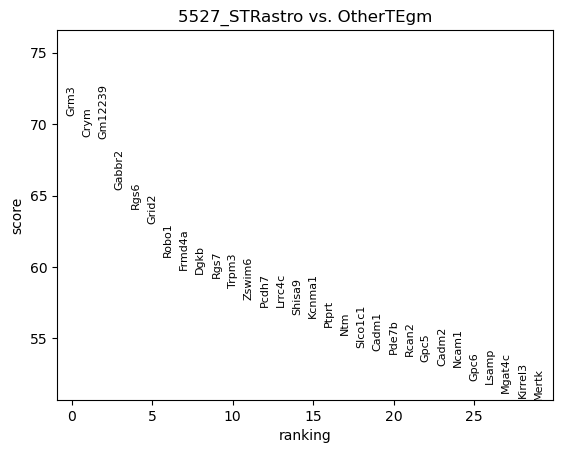

In [26]:
# Create a new obs column for group assignment
mouse_TEgm_ds.obs['group_for_DEG'] = (
    (mouse_TEgm_ds.obs['cluster_id_label'] == '5227 Astro-TE NN_3')
    .map({True: '5527_STRastro', False: 'OtherTEgm'})
)


sc.tl.rank_genes_groups(
    mouse_TEgm_ds,
    groupby='group_for_DEG',
    reference='OtherTEgm',
    method='wilcoxon',
    corr_method = "benjamini-hochberg", 
    pts=True, 
    use_raw=False, 
    key_added="c5527_vs_otherTEgm_ds"
)

# Inspect top genes
sc.pl.rank_genes_groups(mouse_TEgm_ds, n_genes=30, sharey=False, key="c5527_vs_otherTEgm_ds")


In [27]:
print(mouse_TEgm_ds.uns["c5527_vs_otherTEgm_ds"]["names"].dtype.names)
all_groups = mouse_TEgm_ds.uns["c5527_vs_otherTEgm_ds"]["names"].dtype.names

df_all = pd.concat([
    sc.get.rank_genes_groups_df(mouse_TEgm_ds, group=grp, key='c5527_vs_otherTEgm_ds').assign(group=grp)
    for grp in all_groups
])

display(df_all.head(30))
df_all.to_csv("rank_genes_groups_c5527_vs_otherTEgm_ds_inMouseABCatlas.csv", index=False)

('5527_STRastro',)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group
0,Grm3,70.607452,2.795999,0.0,0.0,0.998001,5527_STRastro
1,Crym,69.093491,7.427140,0.0,0.0,0.746901,5527_STRastro
2,Gm12239,68.961525,5.461459,0.0,0.0,0.941490,5527_STRastro
3,Gabbr2,65.410454,5.576538,0.0,0.0,0.844729,5527_STRastro
4,Rgs6,64.088242,4.767616,0.0,0.0,0.959749,5527_STRastro
5,Grid2,63.053791,2.506051,0.0,0.0,0.995602,5527_STRastro
6,Robo1,60.692200,4.423251,0.0,0.0,0.878982,5527_STRastro
7,Frmd4a,59.780037,2.039627,0.0,0.0,0.998934,5527_STRastro
8,Dgkb,59.531013,1.401622,0.0,0.0,0.997734,5527_STRastro
9,Rgs7,59.251022,4.306628,0.0,0.0,0.950553,5527_STRastro


In [30]:
mouse_hits_up = (
    df_all.query("group == '5527_STRastro'")
        .loc[lambda d: (d['logfoldchanges'] > 1) &
                        (d['pvals_adj'] < 0.01) &
                        (d['pct_nz_group'] > 0.2)]
        .sort_values(['scores', 'logfoldchanges'], ascending=[False, False])
)

# show a preview and save
mouse_hits_up['gene'] = mouse_hits_up['names'].str.upper()
display(mouse_hits_up.head(30)) 
mouse_hits_up.to_csv( "C5527_up_sig_1483genes_filtered.csv", index=False)

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group,gene
0,Grm3,70.607452,2.795999,0.0,0.0,0.998001,5527_STRastro,GRM3
1,Crym,69.093491,7.427140,0.0,0.0,0.746901,5527_STRastro,CRYM
2,Gm12239,68.961525,5.461459,0.0,0.0,0.941490,5527_STRastro,GM12239
3,Gabbr2,65.410454,5.576538,0.0,0.0,0.844729,5527_STRastro,GABBR2
4,Rgs6,64.088242,4.767616,0.0,0.0,0.959749,5527_STRastro,RGS6
5,Grid2,63.053791,2.506051,0.0,0.0,0.995602,5527_STRastro,GRID2
6,Robo1,60.692200,4.423251,0.0,0.0,0.878982,5527_STRastro,ROBO1
7,Frmd4a,59.780037,2.039627,0.0,0.0,0.998934,5527_STRastro,FRMD4A
8,Dgkb,59.531013,1.401622,0.0,0.0,0.997734,5527_STRastro,DGKB
9,Rgs7,59.251022,4.306628,0.0,0.0,0.950553,5527_STRastro,RGS7


In [34]:
mouse_hits_down = (
    df_all.query("group == '5527_STRastro'")
        .loc[lambda d: (d['logfoldchanges'] < -1) &
                        (d['pvals_adj'] < 0.01)] # &(d['pct_nz_group'] > 0.2)
        .sort_values(['scores', 'logfoldchanges'], ascending=[False, False])
)

# show a preview and save
mouse_hits_down['gene'] = mouse_hits_down['names'].str.upper()
display(mouse_hits_down.head(30)) 
mouse_hits_down.to_csv("C5527_Down_sig_435genes_filtered.csv", index=False)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group,gene
30878,Minar2,-3.104557,-1.197738,0.001906,0.009699,0.030388,5527_STRastro,MINAR2
30881,Fstl5,-3.119258,-1.147195,0.001813,0.009259,0.035852,5527_STRastro,FSTL5
30898,Iqcg,-3.170829,-1.808867,0.001520,0.007856,0.015460,5527_STRastro,IQCG
30902,Pcgf2,-3.188356,-1.603821,0.001431,0.007434,0.019192,5527_STRastro,PCGF2
30903,Moxd1,-3.189734,-3.623164,0.001424,0.007401,0.003332,5527_STRastro,MOXD1
30906,Cav1,-3.197562,-2.862122,0.001386,0.007213,0.005998,5527_STRastro,CAV1
30910,Nfatc4,-3.213059,-4.671577,0.001313,0.006851,0.001466,5527_STRastro,NFATC4
30911,Dpysl5,-3.215503,-1.721643,0.001302,0.006796,0.016927,5527_STRastro,DPYSL5
30918,Dctpp1,-3.232965,-1.001446,0.001225,0.006416,0.041983,5527_STRastro,DCTPP1
30919,Kif27,-3.234115,-2.104810,0.001220,0.006393,0.011462,5527_STRastro,KIF27


In [35]:
mouse_hits_up  = mouse_hits_up.assign(direction='striatal_astro_up')    
mouse_hits_down = mouse_hits_down.assign(direction='striatal_astro_down')  

mouse_hits_all = pd.concat([mouse_hits_up, mouse_hits_down], ignore_index=True)

In [37]:
mouse_hits_all  = mouse_hits_all.assign(species='mouse')    
hits_all = hits_all.assign(species='human')  

hits = pd.concat([mouse_hits_all, hits_all], ignore_index=True)

In [38]:
hits

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,group,gene,direction,species
0,Grm3,70.607452,2.795999,0.000000e+00,0.000000e+00,0.998001,5527_STRastro,GRM3,striatal_astro_up,mouse
1,Crym,69.093491,7.427140,0.000000e+00,0.000000e+00,0.746901,5527_STRastro,CRYM,striatal_astro_up,mouse
2,Gm12239,68.961525,5.461459,0.000000e+00,0.000000e+00,0.941490,5527_STRastro,GM12239,striatal_astro_up,mouse
3,Gabbr2,65.410454,5.576538,0.000000e+00,0.000000e+00,0.844729,5527_STRastro,GABBR2,striatal_astro_up,mouse
4,Rgs6,64.088242,4.767616,0.000000e+00,0.000000e+00,0.959749,5527_STRastro,RGS6,striatal_astro_up,mouse
...,...,...,...,...,...,...,...,...,...,...
2721,PDE3B_ENSG00000152270,-33.538452,-4.465509,1.326622e-246,4.622574e-243,0.156386,C55,PDE3B,striatal_astro_down,human
2722,SGCD_ENSG00000170624,-41.465214,-3.149336,0.000000e+00,0.000000e+00,0.654214,C55,SGCD,striatal_astro_down,human
2723,CTNNA2_ENSG00000066032,-43.723164,-1.528495,0.000000e+00,0.000000e+00,0.973067,C55,CTNNA2,striatal_astro_down,human
2724,AL137139.2_ENSG00000286757,-43.927746,-4.208178,0.000000e+00,0.000000e+00,0.460035,C55,AL137139.2,striatal_astro_down,human


striatal_astro_up mouse genes: 1483
striatal_astro_up human genes: 679
intersection: 145


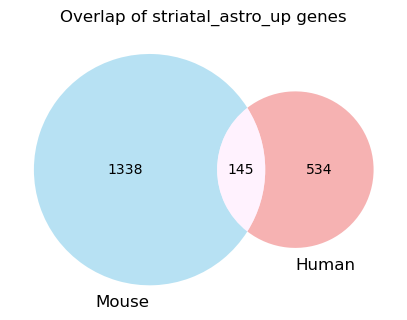

In [55]:
from matplotlib_venn import venn2

# Choose one direction at a time:
direction = 'striatal_astro_up'   # or 'striatal_astro_down'

# Get the gene sets for each species
mouse_genes = set(hits.loc[
    (hits['species']=='mouse') & (hits['direction']==direction), 'gene'
])

human_genes = set(hits.loc[
    (hits['species']=='human') & (hits['direction']==direction), 'gene'
])

print(f"{direction} mouse genes: {len(mouse_genes)}")
print(f"{direction} human genes: {len(human_genes)}")
print(f"intersection: {len(mouse_genes & human_genes)}")

# Draw the Venn diagram
plt.figure(figsize=(5,5))
venn2([mouse_genes, human_genes],
      set_labels=('Mouse', 'Human'),
      set_colors=('skyblue','lightcoral'),
      alpha=0.6)
plt.title(f"Overlap of {direction} genes")

plt.savefig(f"venn_{direction}_mouse_vs_human.pdf",bbox_inches='tight') 
plt.show()


In [56]:
# Compute the intersection set
intersection_genes = mouse_genes & human_genes

# Print them
print(f"Intersection genes ({len(intersection_genes)}):")
print(intersection_genes)

# Save to a text file (one gene per line)
with open(f"venn_{direction}_intersection_genes.txt", "w") as f:
    for g in sorted(intersection_genes):
        f.write(g + "\n")

# Or save as CSV with pandas:
pd.Series(sorted(intersection_genes), name="gene").to_csv(
    f"venn_{direction}_intersection_genes.csv", index=False
)


Intersection genes (145):
{'NOVA1', 'RAP1GAP', 'CRPPA', 'CDK14', 'GPC6', 'MRTFB', 'EPB41L2', 'SEMA6D', 'DLG1', 'DENND1B', 'RAVER2', 'ETNPPL', 'PRRX1', 'SGK3', 'GRID2', 'LMO4', 'MAP2', 'PHACTR1', 'PKNOX2', 'NPHP3', 'TENM3', 'KCNQ5', 'PHYHIPL', 'MID1', 'SPECC1', 'GFRA1', 'ARRB1', 'CRYM', 'CD47', 'CYP7B1', 'DYRK1A', 'KCNIP4', 'CSMD3', 'HIBADH', 'PCDH10', 'TANK', 'FRMD4A', 'CDH11', 'IMMP2L', 'TSC22D2', 'EDEM3', 'NEK1', 'FGF14', 'NKAIN2', 'RB1', 'AGPAT5', 'EPS8', 'PDLIM5', 'FNDC3B', 'MGAT5', 'AQP4', 'NBEAL1', 'GULP1', 'PBX3', 'MEIS2', 'ACAP2', 'FOXP1', 'SNED1', 'RGS9', 'FIGN', 'RGS7', 'TMEM241', 'CEP350', 'PHKA1', 'ZCCHC7', 'GRM3', 'SLITRK2', 'RALGAPA1', 'HIVEP2', 'OSBPL8', 'UBR3', 'ADK', 'PRICKLE2', 'RNF180', 'MEIS1', 'LRRC7', 'AKAP9', 'WWP1', 'ABCA1', 'ARID5B', 'SNTB1', 'NEGR1', 'SGCZ', 'RIMS2', 'PPP1R1B', 'TTC14', 'AKAP6', 'PSME4', 'RNF144A', 'RUNX1T1', 'PCP4', 'NEDD4L', 'ROBO1', 'IGSF11', 'UTRN', 'RBFOX1', 'FAT3', 'LRRC49', 'S100B', 'NCKAP1', 'PDE7B', 'ZFPM2', 'PDE10A', 'PARP8', 'PID1',

In [57]:
# Compute the intersection as a set
intersection_set = mouse_genes & human_genes

# Preserve the order from the human list
#set- no order; lis - yes
human_list = list(hits.loc[
    (hits['species']=='human') & (hits['direction']==direction), 'gene'
])

intersection_genes_ordered = [g for g in human_list if g in intersection_set]

print(f"Intersection genes ({len(intersection_genes_ordered)}):")
print(intersection_genes_ordered)

# Save to txt
with open(f"venn_{direction}_intersection_genes_ordered.txt", "w") as f:
    for g in intersection_genes_ordered:
        f.write(g + "\n")

# Or as CSV
pd.Series(intersection_genes_ordered, name="gene").to_csv(
    f"venn_{direction}_intersection_genes_ordered.csv", index=False
)


Intersection genes (145):
['GRID2', 'TENM3', 'ABCA1', 'PHACTR1', 'MGAT4C', 'ROBO1', 'FRMD4A', 'GPC6', 'PTPRD', 'LRRC7', 'PARP8', 'PBX3', 'PDE10A', 'PCED1B', 'SSBP2', 'ETNPPL', 'RBFOX1', 'PRICKLE2', 'FOXP1', 'NKAIN2', 'GFRA1', 'ME1', 'AKAP6', 'ARPP21', 'MAP2', 'PHKA1', 'PPP1R9A', 'ZFPM2', 'DGKB', 'LIFR', 'PID1', 'RMST', 'CRYM', 'SPON1', 'MEIS2', 'RBMS1', 'PCDH7', 'AQP4', 'NEGR1', 'FAT3', 'RGS7', 'KCNIP4', 'KCNQ5', 'PAM', 'WWTR1', 'PDE7B', 'SGK3', 'PCDH17', 'PRRX1', 'NEDD4L', 'IMMP2L', 'HIVEP2', 'TSC22D2', 'RIMS2', 'NOVA1', 'EPB41L2', 'GRM3', 'RNF144A', 'RNF180', 'PCP4', 'PCDH10', 'UTRN', 'FIGN', 'TMEM241', 'ATP2B1', 'DENND1B', 'FNDC3B', 'CDK14', 'RUNX1T1', 'ERC1', 'CSMD3', 'FGF14', 'EPS8', 'CEP350', 'MEIS1', 'RAP1GAP', 'WLS', 'MGAT5', 'TTPA', 'SEMA6D', 'DLG1', 'MID1', 'WWP1', 'KLHL2', 'HEY2', 'ACAP2', 'IGSF11', 'GPAM', 'NBEAL1', 'LGR4', 'SPECC1', 'TENM4', 'SGCZ', 'TIMP3', 'CYP7B1', 'UBR3', 'RB1', 'PHYHIPL', 'AKAP9', 'LRRC49', 'CDH11', 'PDLIM5', 'RAVER2', 'AGPAT5', 'METTL15', 'CCN1', 'MR

striatal_astro_down mouse genes: 435
striatal_astro_down human genes: 129
intersection: 19


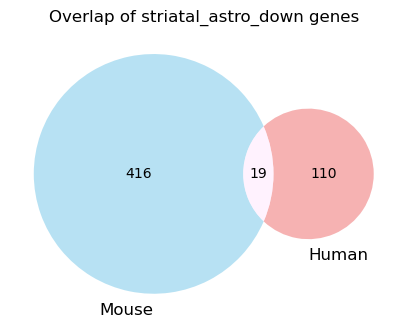

In [49]:

# Choose one direction at a time:
direction = 'striatal_astro_down'   # or 'striatal_astro_up'

# Get the gene sets for each species
mouse_genes = set(hits.loc[
    (hits['species']=='mouse') & (hits['direction']==direction), 'gene'
])

human_genes = set(hits.loc[
    (hits['species']=='human') & (hits['direction']==direction), 'gene'
])

print(f"{direction} mouse genes: {len(mouse_genes)}")
print(f"{direction} human genes: {len(human_genes)}")
print(f"intersection: {len(mouse_genes & human_genes)}")

# Draw the Venn diagram
plt.figure(figsize=(5,5))
venn2([mouse_genes, human_genes],
      set_labels=('Mouse', 'Human'),
      set_colors=('skyblue','lightcoral'),
      alpha=0.6)
plt.title(f"Overlap of {direction} genes")

plt.savefig(f"venn_{direction}_mouse_vs_human.pdf",bbox_inches='tight') 
plt.show()



In [47]:
# Compute the intersection set
intersection_genes = mouse_genes & human_genes

# Print them
print(f"Intersection genes ({len(intersection_genes)}):")
print(intersection_genes)

# Save to a text file (one gene per line)
with open(f"venn_{direction}_intersection_genes.txt", "w") as f:
    for g in sorted(intersection_genes):
        f.write(g + "\n")

# Or save as CSV with pandas:
pd.Series(sorted(intersection_genes), name="gene").to_csv(
    f"venn_{direction}_intersection_genes.csv", index=False
)


Intersection genes (19):
{'NTNG1', 'ZIC5', 'TMSB10', 'ARX', 'AHNAK', 'CAMK2A', 'OTX1', 'LYN', 'ST6GALNAC3', 'ZIC2', 'SHROOM3', 'MBP', 'VSNL1', 'EGLN3', 'TAFA1', 'ANGPT1', 'DGKG', 'CCK', 'ILDR2'}


In [3]:
genes_bothUp_inStriatalAsto_mouseHuman_inHumanTop25genes =['GRID2', 'SHTN1', 'TENM3', 'APOC1', 'EPHA6', 'ABCA1', 'PHACTR1', 'MGAT4C', 'ROBO1', 'FRMD4A', 'GPC6', 'PTPRD']


### show pattern in whole BG taxonomy

### 145 genes both upregulated in mouse/human striatal astrocyte

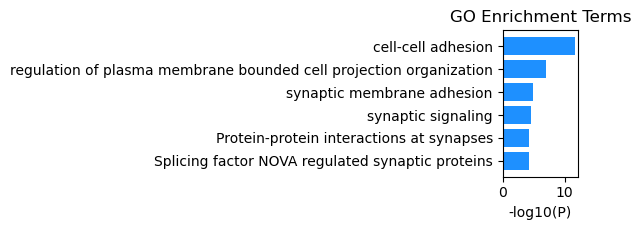

In [53]:
from matplotlib import rcParams

# synaptic-related GO terms and -logP values (manually selected from xlsx.
data = [
    ("cell-cell adhesion", -11.60772152),
    ("regulation of plasma membrane bounded cell projection organization", -6.9598543777),
    ("synaptic membrane adhesion", -4.9596095285),
    ("synaptic signaling", -4.5840405735),
    ("Protein-protein interactions at synapses", -4.3189948912),
    ("Splicing factor NOVA regulated synaptic proteins", -4.3073626475)
]

df = pd.DataFrame(data, columns=['Description', 'LogP'])
df['-log10(P)'] = -df['LogP']  # make positive

# Sort (optional) and reverse order for barh
plot_df = df.sort_values('-log10(P)', ascending=False).iloc[::-1]

rcParams['pdf.fonttype'] = 42  # ensures editable fonts in Illustrator

plt.figure(figsize=(6, 2.4))  # adjust width, height
plt.barh(plot_df['Description'], plot_df['-log10(P)'], color='#1E90FF')
plt.xlabel('-log10(P)')
plt.title('GO Enrichment Terms')
plt.tight_layout()
plt.savefig("barplot_GO_145veenBothUpinSTRastro_synapse-related.pdf", bbox_inches='tight', dpi=300)
plt.show()


In [6]:
genes_showup_atleast3_inaboveTerms = ['GRID2', 'PTPRD', 'DLG1', 'PDLIM5', 'IGSF11', 'CDH11', 'RAP1GAP', 'NEGR1', 'PCDH17', 'NEDD4L', 'AKAP9']
#check out the pattern in whole BG taxonomy

#### genes in whole BG taxonomy

In [2]:
data_dir = f"/allen/programs/celltypes/workgroups/rnaseqanalysis/hct_ux3_cellxgene/anndata_080/BasalGanglia/Astro/../BICAN-releases/final"
adata_bg = sc.read_h5ad(data_dir + "/Human_HMBA_basalganglia_AIT_pre-print.h5ad")

In [4]:
# --- 1) Build the subClass order from display_order_group (unique, order-preserving)
adata_bg.obs['display_order_group'] = adata_bg.obs['display_order_group'].astype('category')
group_to_subclass = (
    adata_bg.obs[['display_order_group', 'Subclass']]
    .drop_duplicates()
    .set_index('display_order_group')['Subclass']
)

group_order = list(adata_bg.obs['display_order_group'].cat.categories)

subclass_order = []
seen = set()
for g in group_order:
    scname = group_to_subclass[g]
    if scname not in seen:
        subclass_order.append(scname)
        seen.add(scname)

# Keep only categories that actually exist in the object
present = pd.Index(adata_bg.obs['Subclass'].unique())
subclass_order = [c for c in subclass_order if c in present]
print(subclass_order)

# --- 2) Set subClass as ordered categorical by that order
adata_bg.obs['Subclass'] = pd.Categorical(adata_bg.obs['Subclass'],
                                          categories=subclass_order,
                                          ordered=True)

['Astrocyte', 'Ependymal', 'Microglia', 'Macrophage', 'Lymphocyte', 'Monocyte', 'Oligodendrocyte', 'OPC', 'COP', 'Endo', 'Pericyte', 'SMC', 'VLMC', 'F Glut', 'F M Glut', 'M Dopa', 'CN LAMP5-LHX6 GABA', 'CN ST18 GABA', 'STR SST-CHODL GABA', 'STR SST GABA', 'STR RSPO2 GABA', 'CN Cholinergic GABA', 'CN LAMP5-CXCL14 GABA', 'CN VIP GABA', 'CN LHX8 GABA', 'CN ONECUT1 GABA', 'F M GATA3 GABA', 'SN PAX7 GABA', 'F GABA', 'CN MEIS2 GABA', 'STR D1 MSN', 'STR D2 MSN', 'STR Hybrid MSN', 'OT Granular GABA', 'ACx MEIS2 GABA', 'CN GABA-Glut']


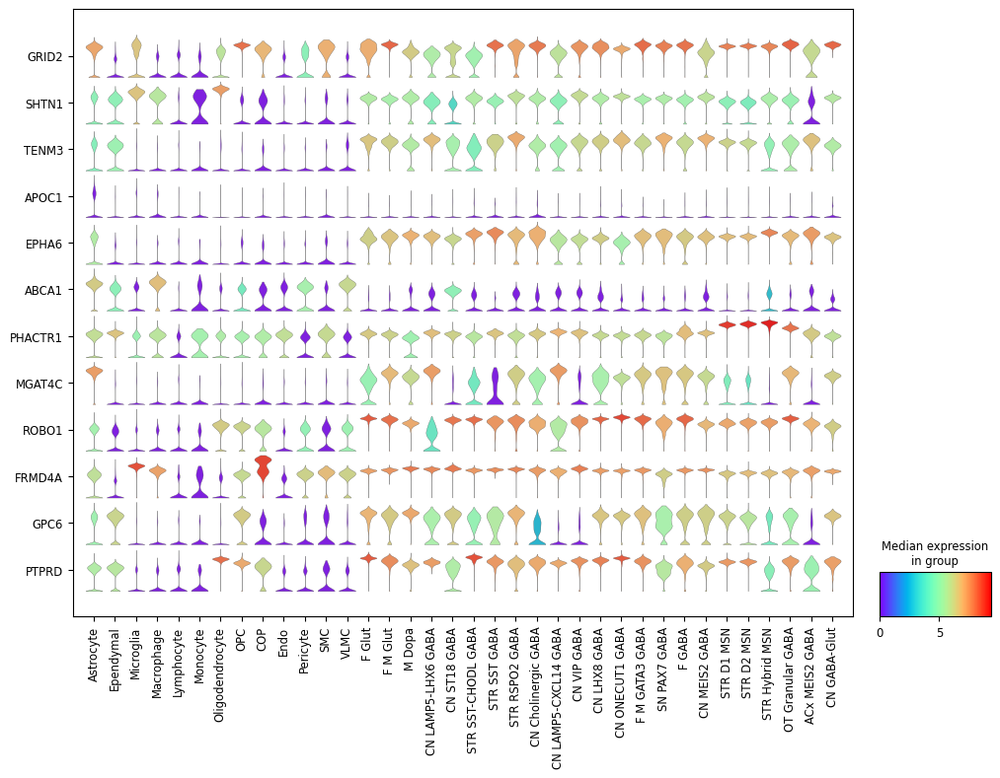

In [5]:
# --- 3) Violin plot for genes of interest
matplotlib.rcParams['pdf.fonttype'] = 42

sc.pl.stacked_violin(
    adata_bg, 
    genes_bothUp_inStriatalAsto_mouseHuman_inHumanTop25genes, 
    groupby='Subclass', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(12,8),
    cmap='rainbow', #Blues
    dendrogram=False,
   # save="Violinplot_of_subGroups-Astro-Markers_of_fig2_in_HMBAhumanBGTaxo.pdf"
)

In [7]:
target = ["STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN", "OT Granular GABA"] #"STR D1D2 Hybrid MSN", 
adata_bg_target = adata_bg[adata_bg.obs["Subclass"].isin(target)]
adata_bg_target.shape


(450613, 36601)

In [8]:
group_order = ['OT D1 ICj', 'STRv D1 MSN', 'STRv D2 MSN', 'STRv D1 NUDAP MSN', 'STR D1D2 Hybrid MSN', 'STRd D1 Matrix MSN', 'STRd D2 Matrix MSN', 'STRd D1 Striosome MSN', 'STRd D2 Striosome MSN', 'STRd D2 StrioMat Hybrid MSN']
adata_bg_target.obs['Group'] = pd.Categorical(adata_bg_target.obs['Group'],
                                              categories=group_order,
                                              ordered=True)

/scratch/fast/3603932/ipykernel_935335/3568972149.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_bg_target.obs['Group'] = pd.Categorical(adata_bg_target.obs['Group'],


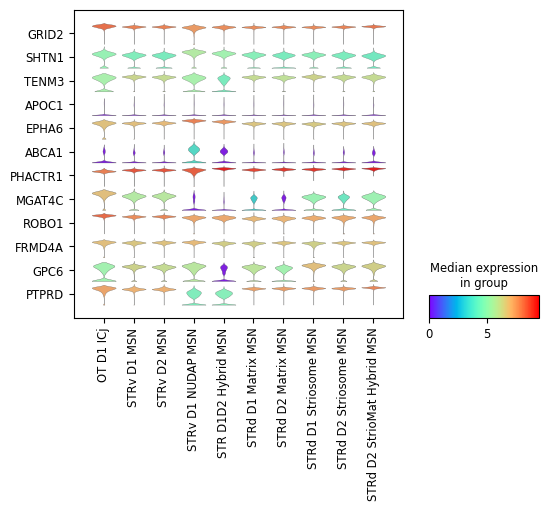

In [9]:

sc.pl.stacked_violin(
    adata_bg_target, 
    genes_bothUp_inStriatalAsto_mouseHuman_inHumanTop25genes, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(6,4),
    cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_h7cluster-Astro-Markers_of_fig5_in_HMBAhumanBGTaxoMSN.pdf"
)



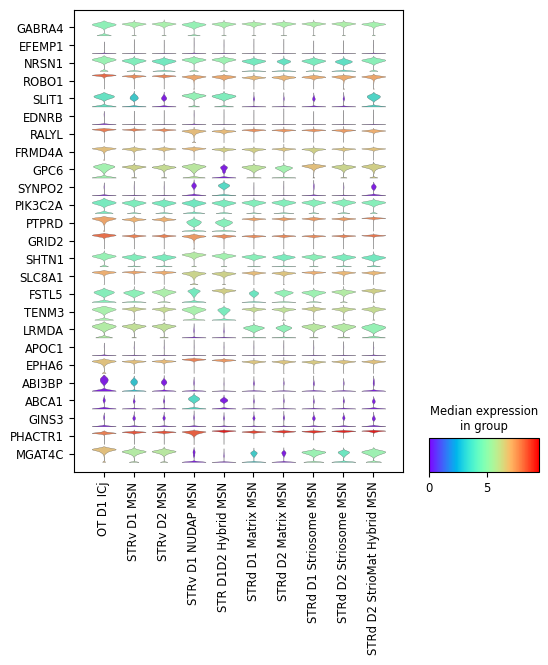

In [15]:
genes_Up_inStriatalAsto_HumanTop25genes = [
    "GABRA4", "EFEMP1", "NRSN1", "ROBO1", "SLIT1", "EDNRB", "RALYL", "FRMD4A",
    "GPC6", "SYNPO2", "PIK3C2A", "PTPRD", "GRID2", "SHTN1*", "SLC8A1",
    "FSTL5", "TENM3", "LRMDA", "APOC1", "EPHA6", "ABI3BP", "ABCA1*",
    "GINS3", "PHACTR1", "MGAT4C"
]
genes_Up_inStriatalAsto_HumanTop25genes = [g.replace('*','') for g in genes_Up_inStriatalAsto_HumanTop25genes]


sc.pl.stacked_violin(
    adata_bg_target, 
    genes_Up_inStriatalAsto_HumanTop25genes, 
    groupby='Group', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(6,6),
    cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_h7cluster-Astro-Markers_of_fig5_in_HMBAhumanBGTaxoMSN.pdf"
)


In [11]:
grid2_pairs = ["CBLN1","CBLN2","NRXN1","NRXN2"]
ptprd_pairs = ["SLITRK1","SLITRK2","SLITRK3","SLITRK4","SLITRK5","SLITRK6","IL1RAPL1","LRRC4C"]
robo1_pairs = ["SLIT1","SLIT2","SLIT3"]
epha6_pairs = ["EFNA3","EFNA4","EFNA5"]

pairs_dict = {
    "GRID2": grid2_pairs,
    "PTPRD": ptprd_pairs,
    "ROBO1": robo1_pairs,
    "EPHA6": epha6_pairs,
}


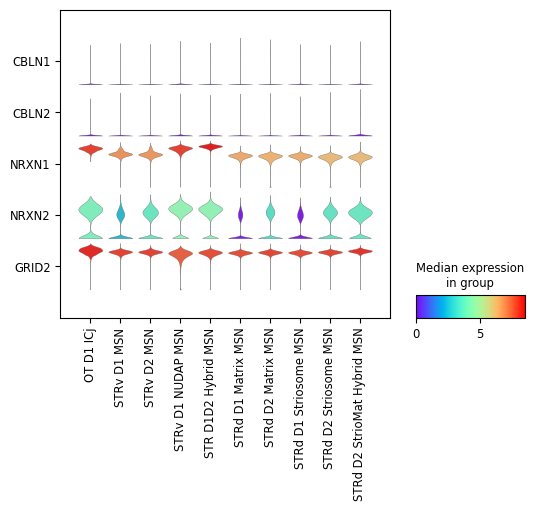

In [13]:
sc.pl.stacked_violin(
    adata_bg_target, 
    grid2_pairs + ['GRID2'], 
    groupby='Group', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(6,4),
    cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_h7cluster-Astro-Markers_of_fig5_in_HMBAhumanBGTaxoMSN.pdf"
)


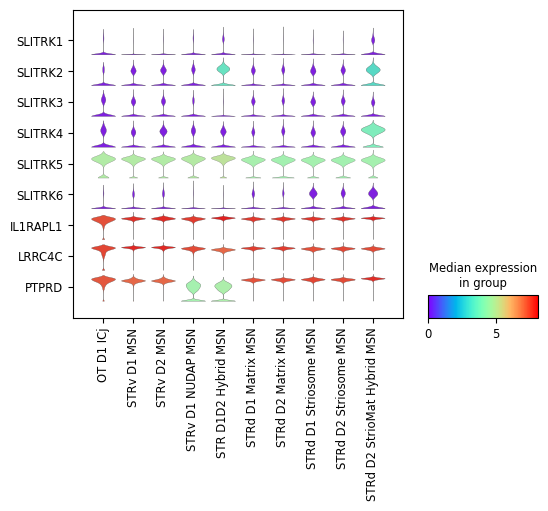

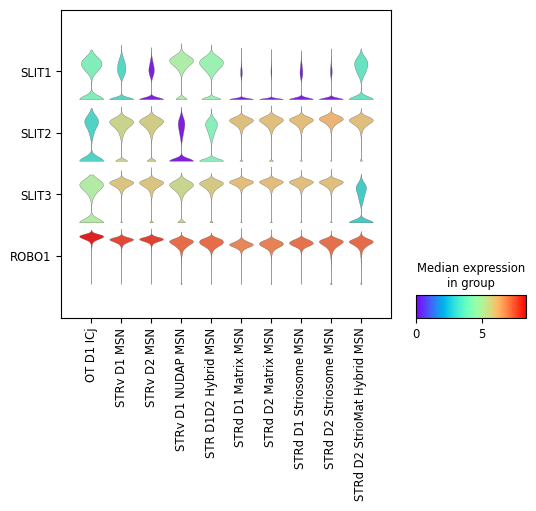

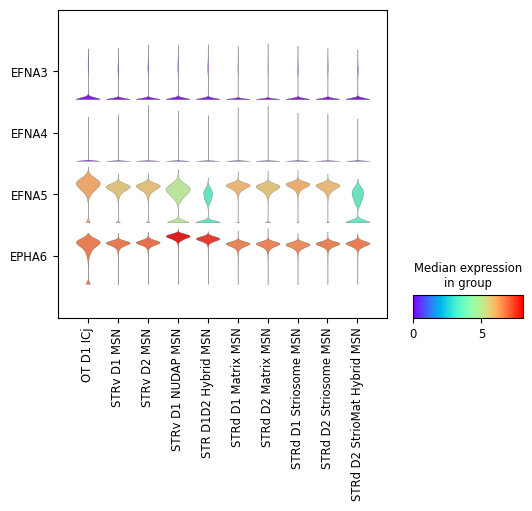

In [14]:
sc.pl.stacked_violin(
    adata_bg_target, 
    ptprd_pairs + ['PTPRD'], 
    groupby='Group', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(6,4),
    cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_h7cluster-Astro-Markers_of_fig5_in_HMBAhumanBGTaxoMSN.pdf"
)

sc.pl.stacked_violin(
    adata_bg_target, 
    robo1_pairs + ['ROBO1'], 
    groupby='Group', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(6,4),
    cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_h7cluster-Astro-Markers_of_fig5_in_HMBAhumanBGTaxoMSN.pdf"
)

sc.pl.stacked_violin(
    adata_bg_target, 
    epha6_pairs + ['EPHA6'], 
    groupby='Group', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(6,4),
    cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_h7cluster-Astro-Markers_of_fig5_in_HMBAhumanBGTaxoMSN.pdf"
)

In [16]:
target = ["Astrocyte"] #"STR D1D2 Hybrid MSN", 
adata_bg_target2 = adata_bg[adata_bg.obs["Group"].isin(target)]
adata_bg_target2.shape


(136684, 36601)

In [19]:
clusters_to_plot = ['h-7', 'h-14', 'h-31', #GM STRv, STR, STRd
                    'h-145', 'h-150', 'h-149', 'h-146', 'h-160', 'h-450', 'h-452', 'h-152', 'h-159',#GM ex_STRd
                    'h-472', 'h-479', 'h-485', 'h-230', 'h-231', 'h-28',  'h-227',   #WM
                    'h-232', 'h-143', ] #everywhere, BNST-HTH? 
adata_bg_target2.obs['Cluster'] = pd.Categorical([str(x) for x in adata_bg_target2.obs['Cluster']], categories=clusters_to_plot, ordered=True)


/scratch/fast/3603932/ipykernel_935335/4006013085.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_bg_target2.obs['Cluster'] = pd.Categorical([str(x) for x in adata_bg_target2.obs['Cluster']], categories=clusters_to_plot, ordered=True)


KeyError: "None of [Index(['h-7', 'h-14', 'h-31', 'h-145', 'h-150', 'h-149', 'h-146', 'h-160',\n       'h-450', 'h-452', 'h-152', 'h-159', 'h-472', 'h-479', 'h-485', 'h-230',\n       'h-231', 'h-28', 'h-227', 'h-232', 'h-143'],\n      dtype='object')] are in the [index]"

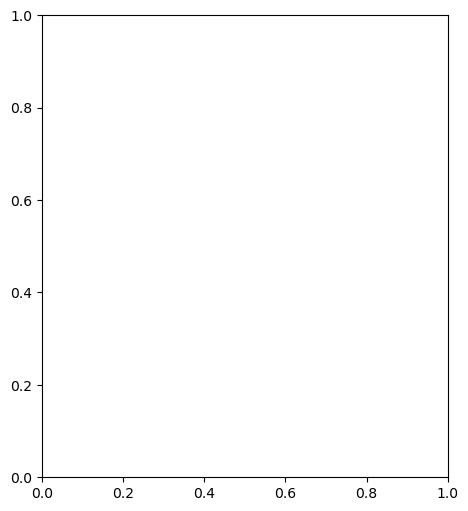

In [20]:
sc.pl.stacked_violin(
    adata_bg_target2, 
    genes_Up_inStriatalAsto_HumanTop25genes, 
    groupby='Cluster', 
    use_raw=False, 
    swap_axes=True, 
    figsize=(7,6),
    cmap='rainbow', #Blues
    dendrogram=False,
    #save="Violinplot_of_h7cluster-Astro-Markers_of_fig5_in_HMBAhumanBGTaxoMSN.pdf"
)

#### what makes mouse STRastro distinct from TE_GM (only compare within one supertype??) probably no.

In [ ]:
## cluster_id_label #anatomical_annotation (Yao et al, 2023 Nature - Supp_Table 7)

 # '5218 Astro-TE NN_1',  CTX pia sparse (drop - only CTX pia and sparse)
 # '5219 Astro-TE NN_1',  pia and fiber tract & may clean up more (keep - TE ILA; also highlighted in paper)
 # '5220 Astro-TE NN_1',  CTX pia sparse (drop)
 # '5221 Astro-TE NN_1',  CTX pia sparse (drop)
 # '5222 Astro-TE NN_2',  DG RGL-like(keep as contrast so that we cover all the supertypes)
 # '5223 Astro-TE NN_2',  DG cycling(drop -HIP)
 # '5224 Astro-TE NN_3',  enriched in LSX, HIP, DP-TT & may clean up more (drop)
 # '5225 Astro-TE NN_3',  Isocortex, OLF (keep as CTX GM contrast)
 # '5226 Astro-TE NN_3',  LSX and midline (keep - LSX belongs to STR in mice)
 # '5227 Astro-TE NN_3',  STRd (keep)
 # '5228 Astro-TE NN_4',  HIP/CTXsp (keep as contrast)
 # '5229 Astro-TE NN_5',  SVZ STRd AON (keep) RMS
 # '5230 Astro-TE NN_5'   SVZ STRd me;SVZ RGL-like (keep) RMS

In [62]:
mouse_TE.obs['cluster_id_label'] = mouse_TE.obs['cluster_id_label'].astype(str)

keep_clusters = ['5225 Astro-TE NN_3', '5226 Astro-TE NN_3', '5227 Astro-TE NN_3', '5228 Astro-TE NN_4'] #GM 
mouse_TE_GM = mouse_TE[mouse_TE.obs['cluster_id_label'].isin(keep_clusters)].copy()


In [63]:
mouse_TE_GM_ds = downsample_per_cluster(
    mouse_TE_GM,
    cluster_key="cluster_id_label",
    max_cells_per_cluster=3000,
    exempt_clusters=["5227 Astro-TE NN_3"],   # or ["5227 Astro-TE NN_3"] 
    random_state=4321
)

mouse_TE_GM_ds.obs['cluster_id_label'].value_counts()

cluster_id_label
5227 Astro-TE NN_3    7503
5226 Astro-TE NN_3    3000
5225 Astro-TE NN_3    3000
5228 Astro-TE NN_4     982
Name: count, dtype: int64

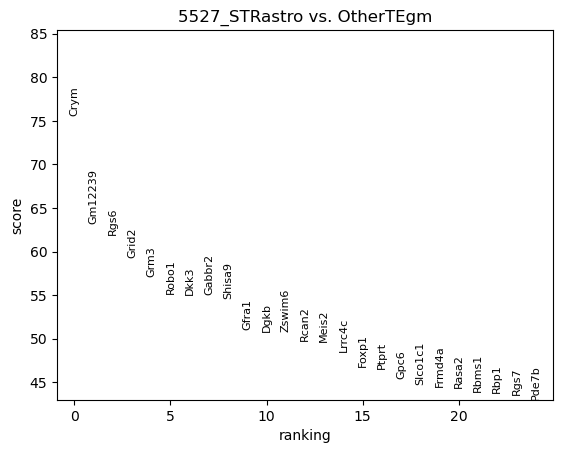

In [65]:
# Create a new obs column for group assignment
mouse_TE_GM_ds.obs['group_for_DEG'] = (
    (mouse_TE_GM_ds.obs['cluster_id_label'] == '5227 Astro-TE NN_3')
    .map({True: '5527_STRastro', False: 'OtherTEgm'})
)


sc.tl.rank_genes_groups(
    mouse_TE_GM_ds,
    groupby='group_for_DEG',
    reference='OtherTEgm',
    method='wilcoxon',
    corr_method = "benjamini-hochberg", 
    pts=True, 
    use_raw=False, 
    key_added="c5527_vs_otherTEgm_ds"
)

# Inspect top genes
sc.pl.rank_genes_groups(mouse_TE_GM_ds, n_genes=25, sharey=False, key="c5527_vs_otherTEgm_ds")


In [58]:
# Inspect top genes
sc.pl.rank_genes_groups(mouse_TE_GM_ds, n_genes=35, sharey=False, key="c5527_vs_otherTEgm_ds")


NameError: name 'mouse_TE_GM_ds' is not defined

### to compare mouse and human DEGs

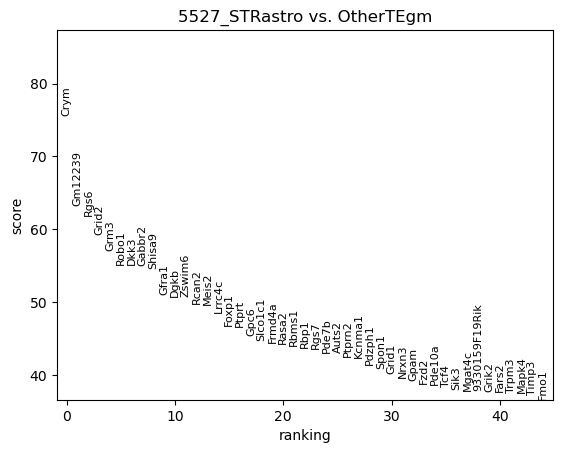

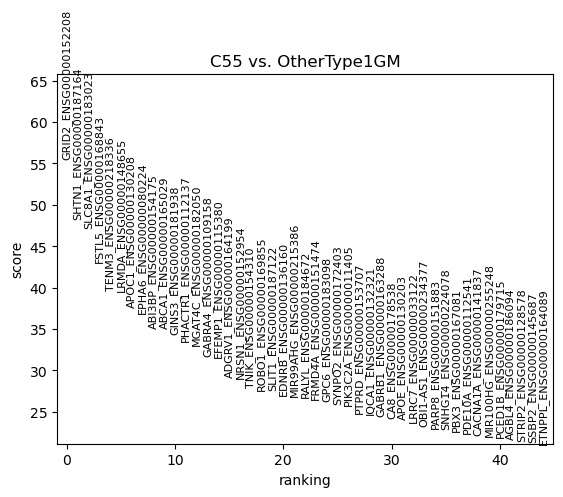

In [67]:
sc.pl.rank_genes_groups(
    mouse_TE_GM_ds,
    key='c5527_vs_otherTEgm_ds',
    n_genes=45,
    sharey=False,
    show=False 
)


sc.pl.rank_genes_groups(
    siletti_type1GM_ds,
    key='c55_vs_otherType1GM_ds',
    n_genes=45,
    sharey=False,
    show=False 
)

In [ ]:
# Grid2
# Robo1
# Gpc6
# Frmd4a
# Mgat4c
# Gabbr2 / Gabbr1 (mouse shows Gabbr2, human shows GABRA4 and GABBR1 — so not an exact match, but related family)

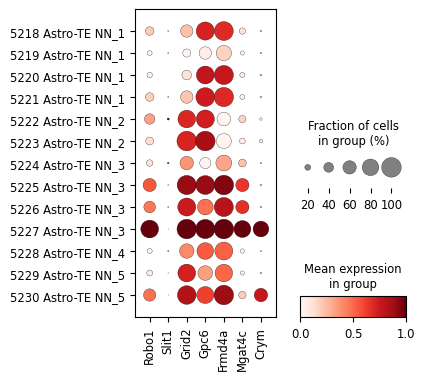

In [72]:
sc.pl.dotplot(mouse_TE_ds, 
              ['Robo1', 'Slit1', 'Grid2', 'Gpc6', 'Frmd4a', 'Mgat4c', 'Crym'], 
              groupby='cluster_id_label', 
              standard_scale='var',#'var',
              use_raw=False, 
              swap_axes=False, 
              figsize=(3.5,4),
             # save="dotplot_NTN1_in_MarmosetSpatialTx_Astro_Clusters.pdf" 
) 

Matched gene IDs: ['ROBO1_ENSG00000169855', 'SLIT1_ENSG00000187122', 'GRID2_ENSG00000152208', 'GPC6_ENSG00000183098', 'FRMD4A_ENSG00000151474', 'MGAT4C_ENSG00000182050', 'CRYM_ENSG00000103316']


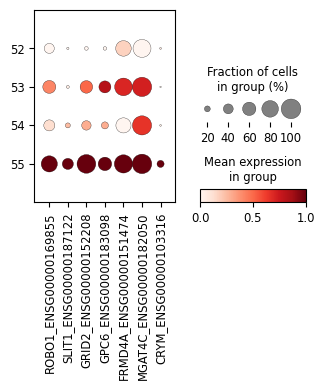

In [74]:
genes = ['ROBO1', 'SLIT1', 'GRID2', 'GPC6', 'FRMD4A', 'MGAT4C', 'CRYM']
all_varnames = siletti.var_names
matched_genes = []
for g in genes:
    matches = [v for v in all_varnames if v.startswith(g + "_")]
    if matches:
        matched_genes.append(matches[0]) 
    else:
        print(f"Warning: {g} not found")
print("Matched gene IDs:", matched_genes)


sc.pl.dotplot(siletti_type1GM_ds, 
              matched_genes, 
              groupby='cluster_id', 
              standard_scale='var',#'var',
              use_raw=False, 
              swap_axes=False, 
              figsize=(3.5,2.5),
             # save="dotplot_NTN1_in_MarmosetSpatialTx_Astro_Clusters.pdf" 
) 